In [1]:
#Cargamos las librerias necesarias:
import pandas as pd
import datetime as dt
import numpy as np
import warnings # nobody likes warnings

import matplotlib.pyplot as plt
import seaborn as sns

# Create an array with the colors you want to use
colors = ["#19213A", "#1A2E54", "#0F3D74", "#13599B", "#50B6FF", "#2DCCCD", "#6389D9", "#EE3A6A", "#F35E61", "#D8BE75", "#FCE287", "#F3F2F3"]
# Set your custom color palette
sns.set_palette(sns.color_palette(colors))

# 🤖 Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, root_mean_squared_error

pd.set_option('display.max_columns', None) # display all columns
warnings.filterwarnings('ignore') # ignore warnings

import sys
sys.path.append(r"C:\Users\FernandoSanz-Extreme\OneDrive - AMCHOR INVESTMENT STRATEGIES SGIIC, S.A\Escritorio\Ironhack\DATA_OCT24_MAD")
from functions import *

In [2]:
#Cargamos el CSV
data = pd.read_csv("loan.csv")
#Hacemos una copia del dataset sobre el que trabajaremos para no perder el original
df = data.copy()

In [3]:
df=df.drop(columns=["ApplicationDate"])

In [6]:
df.select_dtypes(include=[np.number]).corrwith(df.RiskScore)

Age                          -0.164304
AnnualIncome                 -0.483289
CreditScore                  -0.240198
Experience                   -0.166496
LoanAmount                    0.137981
LoanDuration                  0.054550
NumberOfDependents            0.001686
MonthlyDebtPayments           0.036938
CreditCardUtilizationRate     0.108758
NumberOfOpenCreditLines       0.007762
NumberOfCreditInquiries       0.003103
DebtToIncomeRatio             0.326500
BankruptcyHistory             0.377578
PreviousLoanDefaults          0.258659
PaymentHistory               -0.016992
LengthOfCreditHistory        -0.177796
SavingsAccountBalance         0.002190
CheckingAccountBalance       -0.004044
TotalAssets                  -0.297117
TotalLiabilities              0.055617
MonthlyIncome                -0.487039
UtilityBillsPaymentHistory   -0.005196
JobTenure                    -0.004393
NetWorth                     -0.304333
BaseInterestRate              0.256233
InterestRate             

# Get dummies

In [4]:
dummies = pd.get_dummies(df.select_dtypes(exclude='number'), dtype=int, drop_first=True)

In [5]:
dummies

,EmploymentStatus_Self-Employed,EmploymentStatus_Unemployed,EducationLevel_Bachelor,EducationLevel_Doctorate,EducationLevel_High School,EducationLevel_Master,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widowed,HomeOwnershipStatus_Other,HomeOwnershipStatus_Own,HomeOwnershipStatus_Rent,LoanPurpose_Debt Consolidation,LoanPurpose_Education,LoanPurpose_Home,LoanPurpose_Other
0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0
1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
2,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0
3,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
19996,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0
19997,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
19998,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0


In [6]:
num = df.select_dtypes(include="number")
dummy_df = pd.concat([num, dummies], axis=1)
dummy_df

,Age,AnnualIncome,CreditScore,Experience,LoanAmount,LoanDuration,NumberOfDependents,MonthlyDebtPayments,CreditCardUtilizationRate,NumberOfOpenCreditLines,NumberOfCreditInquiries,DebtToIncomeRatio,BankruptcyHistory,PreviousLoanDefaults,PaymentHistory,LengthOfCreditHistory,SavingsAccountBalance,CheckingAccountBalance,TotalAssets,TotalLiabilities,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore,EmploymentStatus_Self-Employed,EmploymentStatus_Unemployed,EducationLevel_Bachelor,EducationLevel_Doctorate,EducationLevel_High School,EducationLevel_Master,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widowed,HomeOwnershipStatus_Other,HomeOwnershipStatus_Own,HomeOwnershipStatus_Rent,LoanPurpose_Debt Consolidation,LoanPurpose_Education,LoanPurpose_Home,LoanPurpose_Other
0,45,39948,617,22,13152,48,2,183,0.354418,1,2,0.358336,0,0,29,9,7632,1202,146111,19183,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0
1,38,39709,628,15,26045,48,1,496,0.087827,5,3,0.330274,0,0,21,9,4627,3460,53204,9595,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
2,47,40724,570,26,17627,36,2,902,0.137414,2,0,0.244729,0,0,20,22,886,895,25176,128874,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0
3,58,69084,545,34,37898,96,1,755,0.267587,2,1,0.436244,0,0,27,10,1675,1217,104822,5370,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
4,37,103264,594,17,9184,36,1,274,0.320535,0,0,0.078884,0,0,26,27,1555,4981,244305,17286,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,44,30180,587,19,24521,36,3,673,0.101288,5,1,0.468077,0,0,21,7,235,3429,80969,25642,2515.000000,0.826217,1,55327,0.216021,0.195574,905.767712,0.627741,0,55.0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0
19996,56,49246,567,33,25818,36,5,414,0.471818,2,0,0.317372,0,0,30,28,6910,183,69571,5569,4103.833333,0.816618,3,64002,0.227318,0.199168,958.395633,0.334418,0,54.0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0
19997,44,48958,645,20,37033,72,3,512,0.216596,3,1,0.023014,0,0,28,8,2175,746,108316,4653,4079.833333,0.887216,3,103663,0.229533,0.226766,945.427454,0.357227,0,45.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
19998,60,41025,560,36,14760,72,3,986,0.364758,4,1,0.534517,0,0,17,13,3037,260,22085,11485,3418.750000,0.843787,5,10600,0.249760,0.264873,411.168284,0.408678,0,59.0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0


# ML Model to predict Loan Approval (with Risk Score)


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      4522
           1       0.82      0.70      0.75      1478

    accuracy                           0.89      6000
   macro avg       0.86      0.82      0.84      6000
weighted avg       0.88      0.89      0.88      6000

Test data accuracy:  0.888
Train data accuracy:  0.8902142857142857


<Figure size 800x600 with 0 Axes>

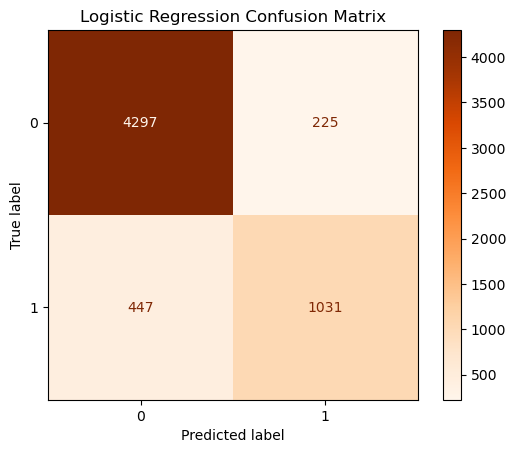

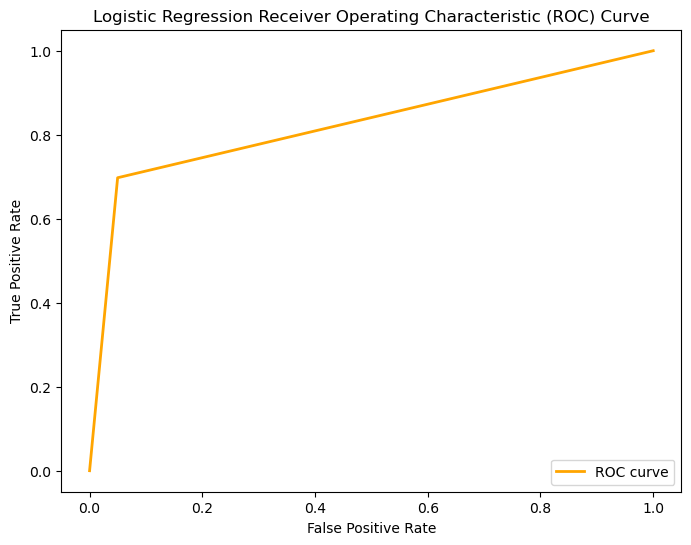


---------------------------------------------------

KNN
with 3 neighbors
              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4522
           1       0.72      0.65      0.68      1478

    accuracy                           0.85      6000
   macro avg       0.80      0.79      0.79      6000
weighted avg       0.85      0.85      0.85      6000

Test data accuracy:  0.8515
Train data accuracy:  0.9210714285714285


<Figure size 800x600 with 0 Axes>

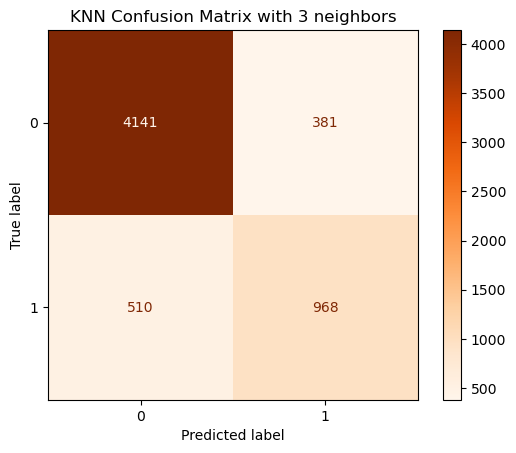

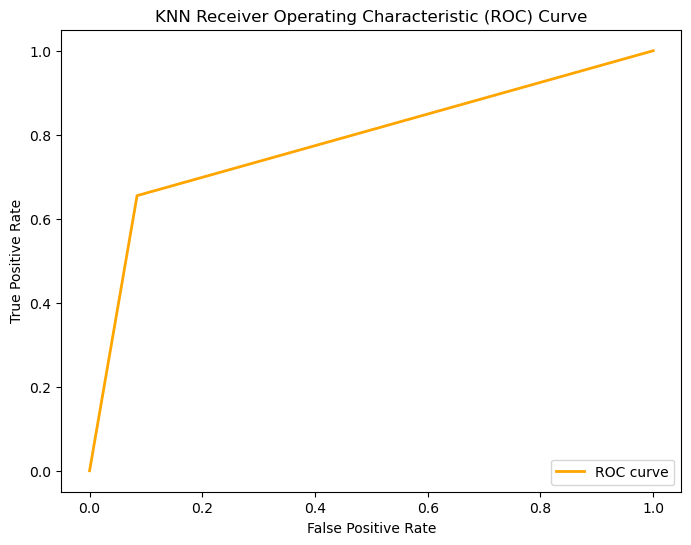


---------------------------------------------------

Decision Tree
with 3 maximum depth
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4522
           1       0.96      0.95      0.96      1478

    accuracy                           0.98      6000
   macro avg       0.97      0.97      0.97      6000
weighted avg       0.98      0.98      0.98      6000

Test data accuracy:  0.9785
Train data accuracy:  0.976


<Figure size 800x600 with 0 Axes>

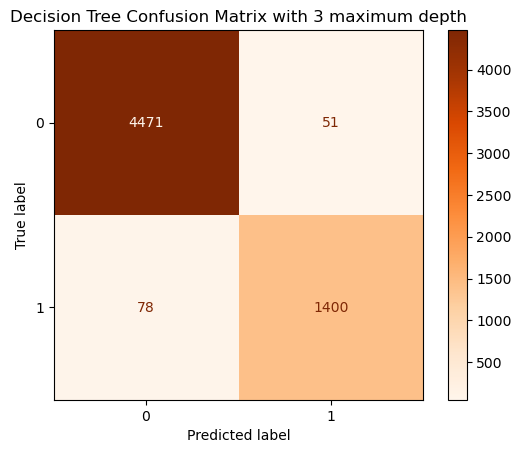

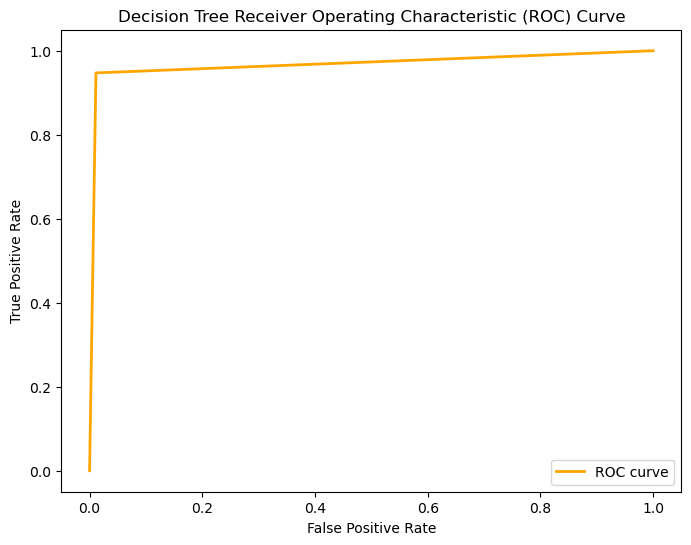


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.95      0.87      0.91      4522
           1       0.69      0.85      0.76      1478

    accuracy                           0.87      6000
   macro avg       0.82      0.86      0.84      6000
weighted avg       0.88      0.87      0.87      6000

Test data accuracy:  0.8691666666666666
Train data accuracy:  0.8701428571428571


<Figure size 800x600 with 0 Axes>

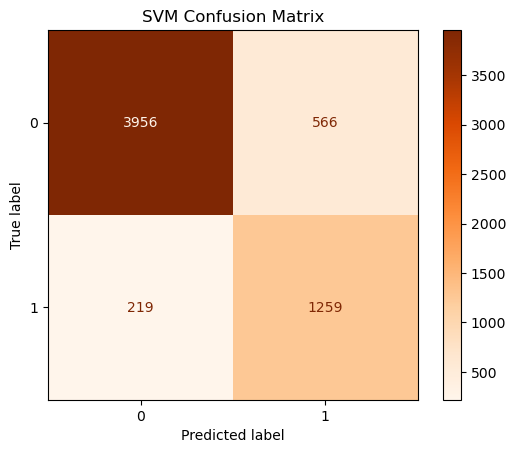

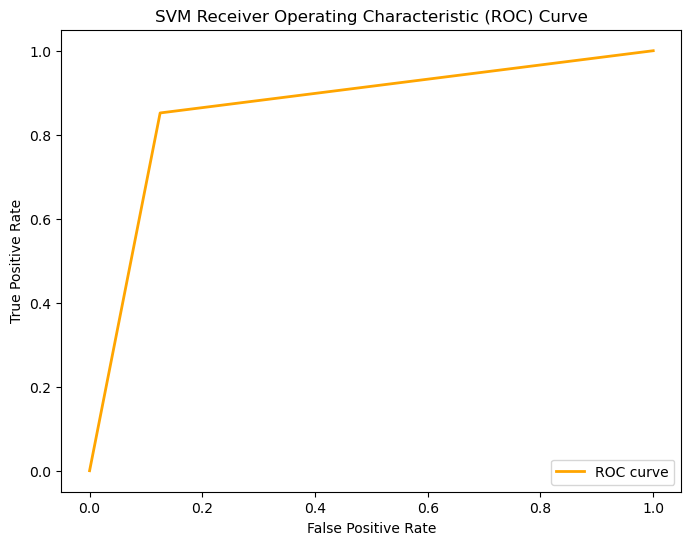


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4522
           1       1.00      1.00      1.00      1478

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000

Test data accuracy:  0.9985
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

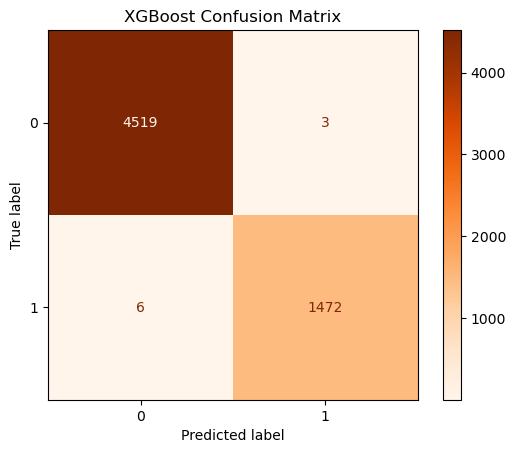

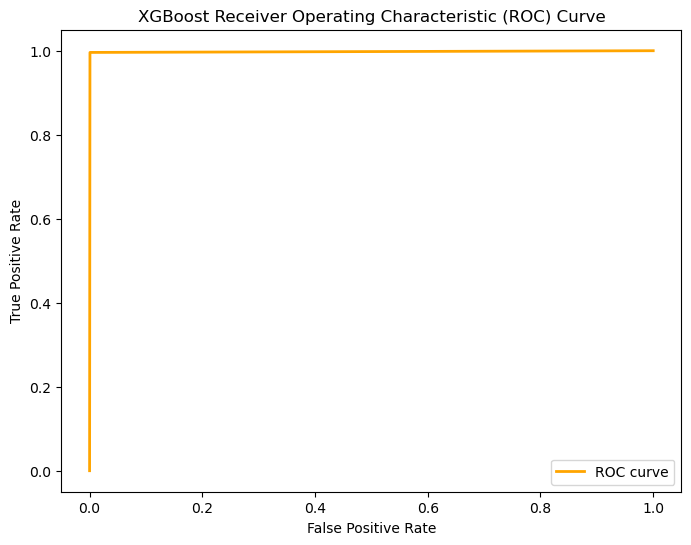

In [ ]:
evaluate_clasification_model(dummy_df, "LoanApproved")

# ML Model to predict Loan Approval (without Risk Score)

In [32]:
dummy_approved = dummy_df.drop(columns="RiskScore")


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      4522
           1       0.82      0.70      0.75      1478

    accuracy                           0.89      6000
   macro avg       0.86      0.82      0.84      6000
weighted avg       0.88      0.89      0.88      6000

Test data accuracy:  0.8873333333333333
Train data accuracy:  0.8899285714285714


<Figure size 800x600 with 0 Axes>

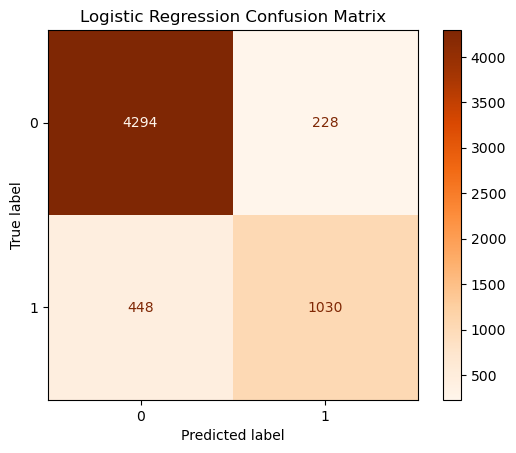

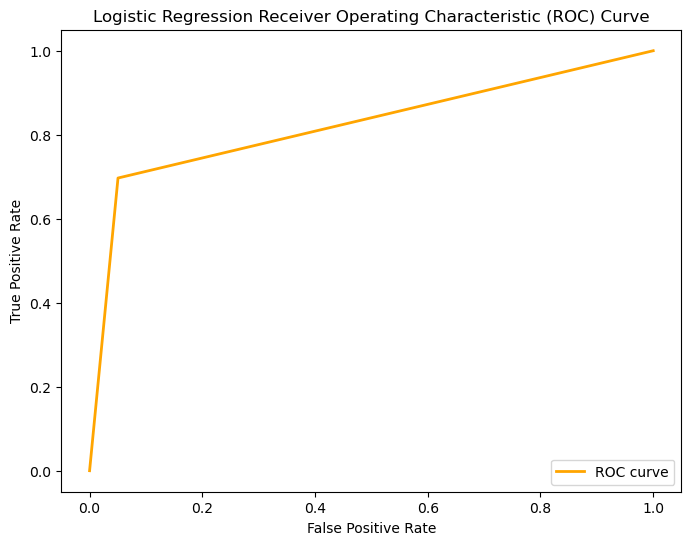


---------------------------------------------------

KNN
with 3 neighbors
              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4522
           1       0.72      0.65      0.68      1478

    accuracy                           0.85      6000
   macro avg       0.80      0.79      0.79      6000
weighted avg       0.85      0.85      0.85      6000

Test data accuracy:  0.8515
Train data accuracy:  0.9210714285714285


<Figure size 800x600 with 0 Axes>

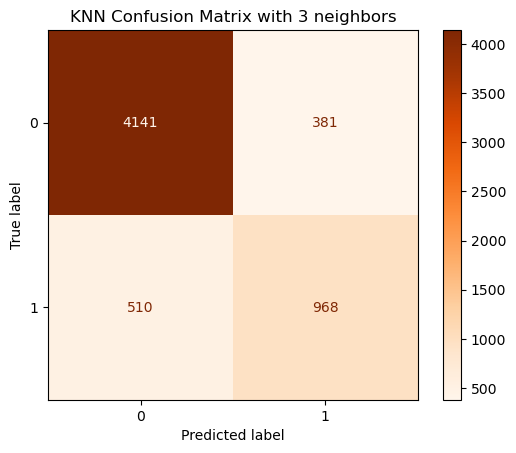

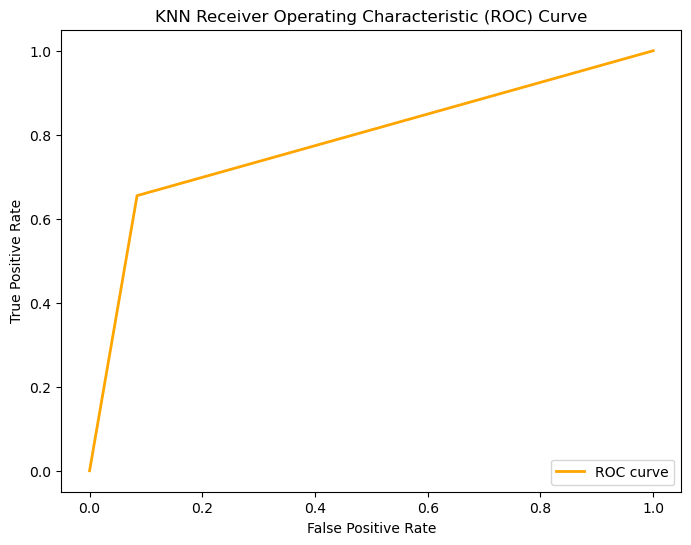


---------------------------------------------------

Decision Tree
with 3 maximum depth
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      4522
           1       0.74      0.78      0.76      1478

    accuracy                           0.88      6000
   macro avg       0.83      0.85      0.84      6000
weighted avg       0.88      0.88      0.88      6000

Test data accuracy:  0.878
Train data accuracy:  0.8799285714285714


<Figure size 800x600 with 0 Axes>

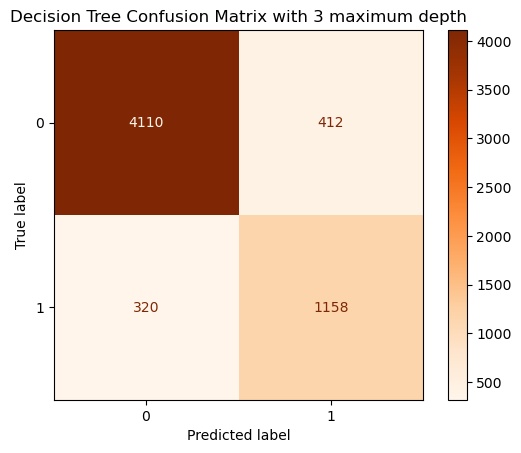

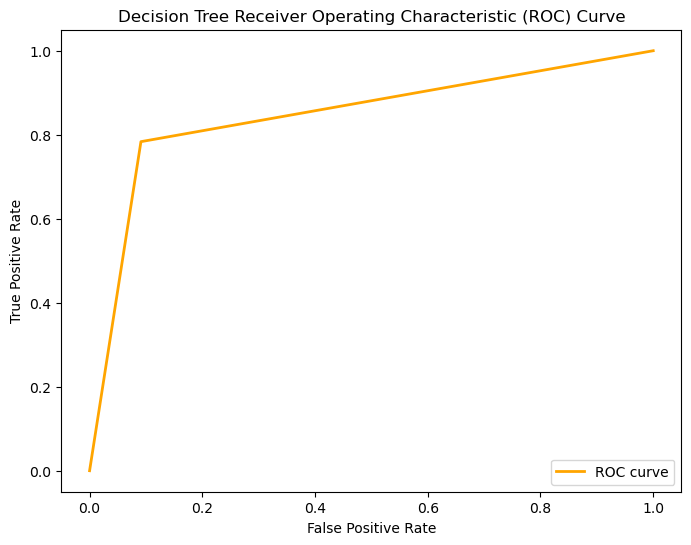


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.85      0.97      0.90      4522
           1       0.82      0.47      0.60      1478

    accuracy                           0.84      6000
   macro avg       0.84      0.72      0.75      6000
weighted avg       0.84      0.84      0.83      6000

Test data accuracy:  0.8448333333333333
Train data accuracy:  0.8508571428571429


<Figure size 800x600 with 0 Axes>

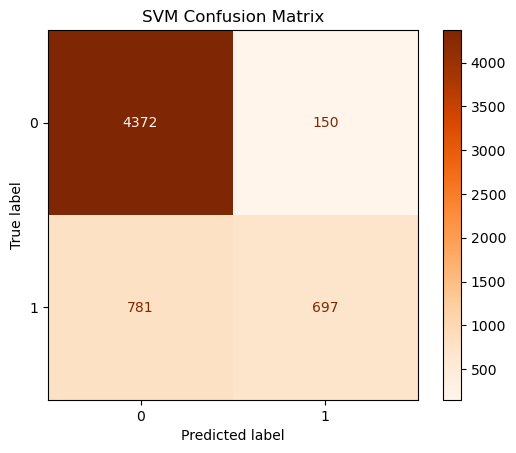

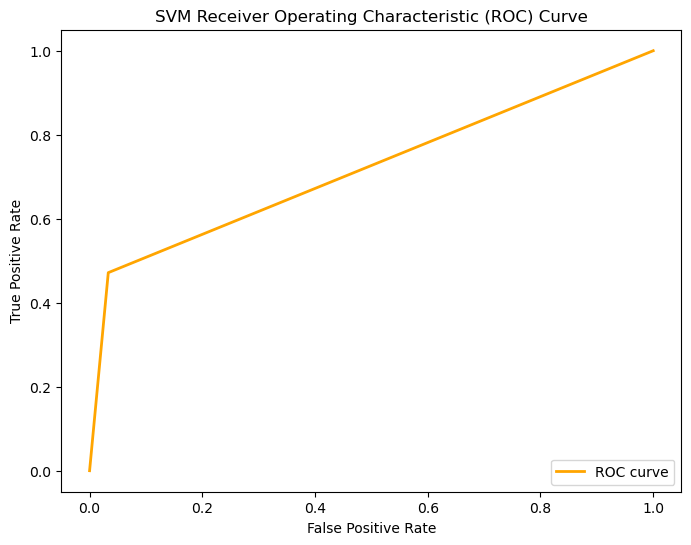


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      4522
           1       0.92      0.89      0.91      1478

    accuracy                           0.95      6000
   macro avg       0.94      0.93      0.94      6000
weighted avg       0.95      0.95      0.95      6000

Test data accuracy:  0.9543333333333334
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

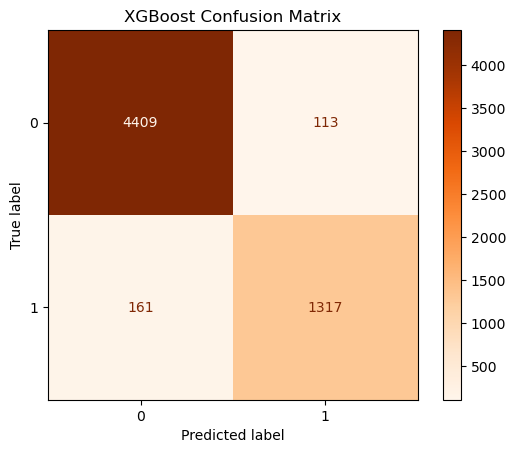

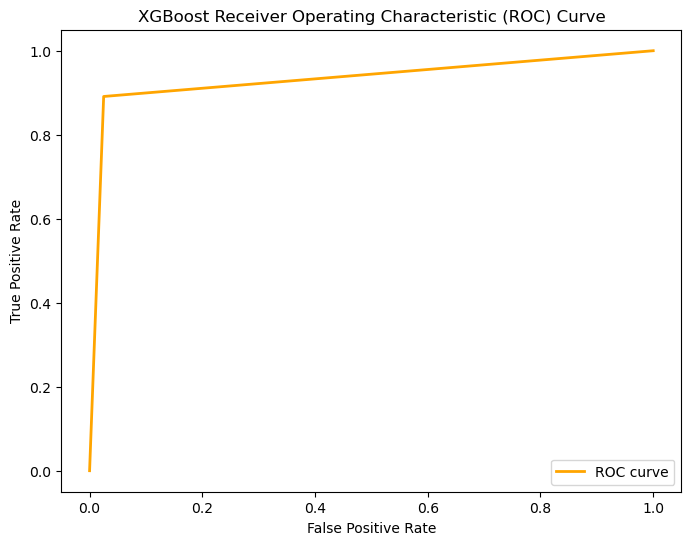

In [33]:
evaluate_clasification_model(dummy_approved, "LoanApproved")

# ML Model to predict Risk Score (without Loan Approval)

In [30]:
dummy_risk = dummy_df.drop(columns="LoanApproved")

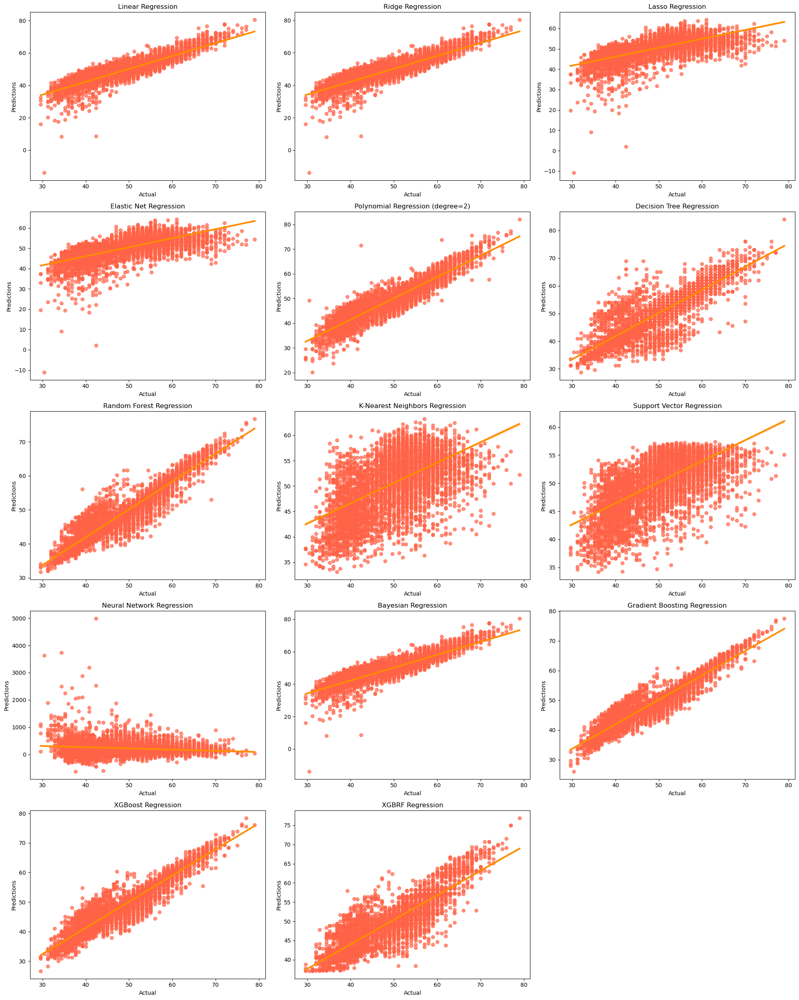

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7747,3.7137,13.7914,2.8597
Ridge Regression,0.7747,3.7134,13.7895,2.8568
Lasso Regression,0.4201,5.9579,35.4971,4.5728
Elastic Net Regression,0.4308,5.9027,34.8419,4.5365
Polynomial Regression (degree=2),0.8477,3.0529,9.3202,2.3560
Decision Tree Regression,0.7086,4.2234,17.8375,2.3333
Random Forest Regression,0.8766,2.7480,7.5514,1.7229
K-Nearest Neighbors Regression,0.2954,6.5675,43.1326,5.0433
Support Vector Regression,0.3927,6.0971,37.1750,4.6690


In [26]:
evaluate_regresion_model(dummy_risk, "RiskScore", graphs=True).T

### We try to Log Transform to check for improvement

----------------------Data Normalized with Log Transform-------------------------


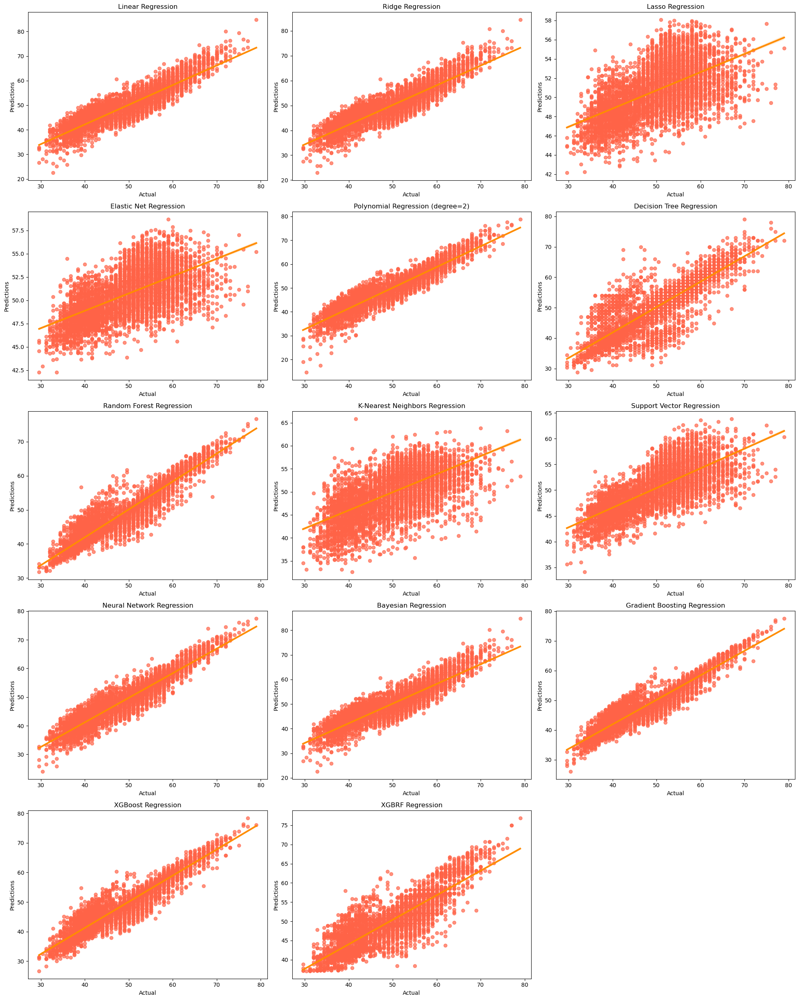

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.8036,3.4673,12.0223,2.7846
Ridge Regression,0.7997,3.5019,12.2633,2.8176
Lasso Regression,0.2679,6.6944,44.8148,5.2277
Elastic Net Regression,0.2742,6.6653,44.4262,5.1860
Polynomial Regression (degree=2),0.8576,2.9524,8.7167,2.3005
Decision Tree Regression,0.7063,4.2403,17.9799,2.3482
Random Forest Regression,0.8765,2.7489,7.5567,1.7250
K-Nearest Neighbors Regression,0.3792,6.1645,38.0017,4.7228
Support Vector Regression,0.4822,5.6300,31.6967,4.3886


In [ ]:
evaluate_regresion_model(dummy_risk, "RiskScore", graphs=True,log=True).T

### We try to normalize the data with Standard Scaler to check for improvement

----------------------Data Normalized with Standard Scaler-------------------------


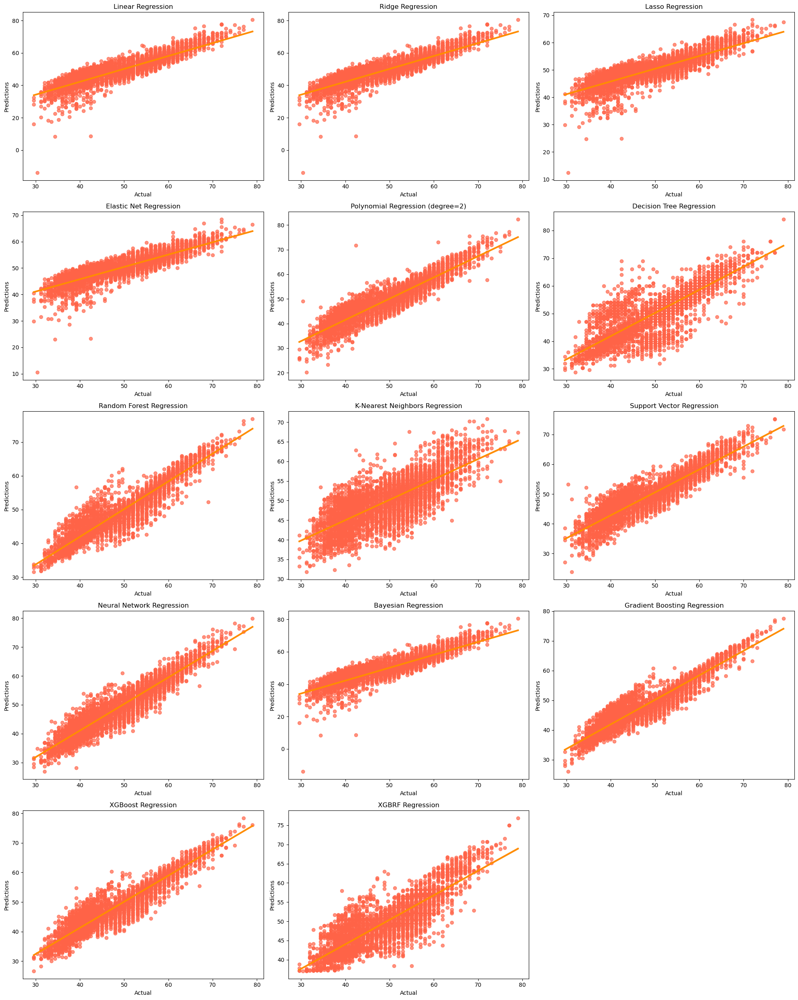

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7747,3.7138,13.7925,2.8598
Ridge Regression,0.7747,3.7136,13.7911,2.8597
Lasso Regression,0.6249,4.7915,22.9585,3.7843
Elastic Net Regression,0.6384,4.7050,22.1372,3.7276
Polynomial Regression (degree=2),0.8479,3.0509,9.3079,2.3549
Decision Tree Regression,0.7085,4.2243,17.8447,2.3309
Random Forest Regression,0.8774,2.7399,7.5073,1.7069
K-Nearest Neighbors Regression,0.5707,5.1263,26.2785,4.0006
Support Vector Regression,0.8254,3.2694,10.6893,2.4136


In [24]:
evaluate_regresion_model(dummy_risk, "RiskScore", graphs=True,stand=True).T

# Let's clean a little bit

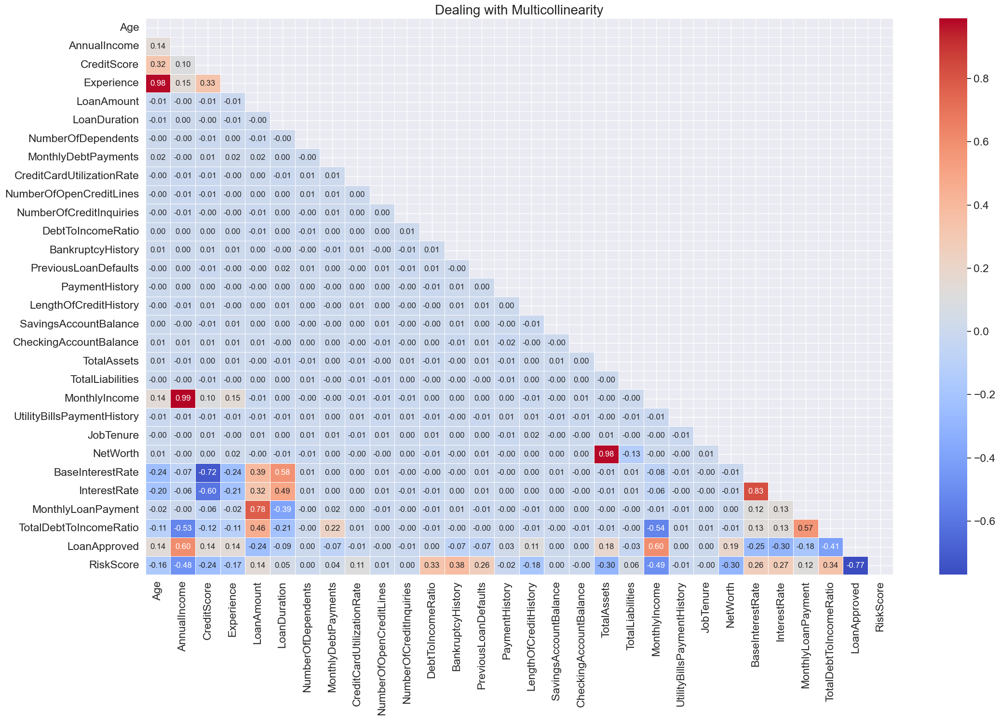

In [35]:
correlation_matrix(df)

In [7]:
dummy_clean_df = dummy_df.copy()

In [8]:
dummy_clean_df.drop(columns=["AnnualIncome", "Age", "TotalAssets"], inplace=True)

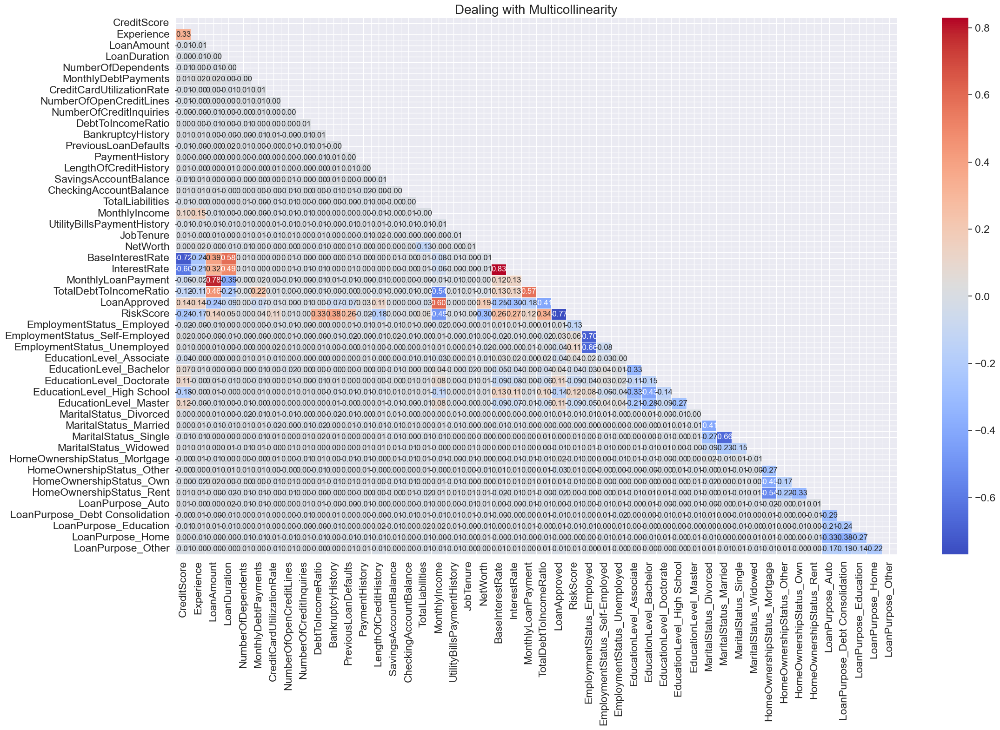

In [39]:
correlation_matrix(dummy_clean_df)

# ML Model to predict Loan Approval (Clean Data with Risk Score)


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      4522
           1       0.82      0.69      0.75      1478

    accuracy                           0.89      6000
   macro avg       0.86      0.82      0.84      6000
weighted avg       0.88      0.89      0.88      6000

Test data accuracy:  0.8876666666666667
Train data accuracy:  0.8889285714285714


<Figure size 800x600 with 0 Axes>

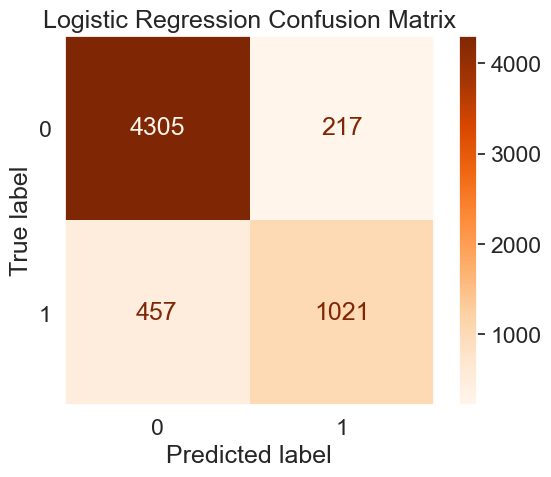

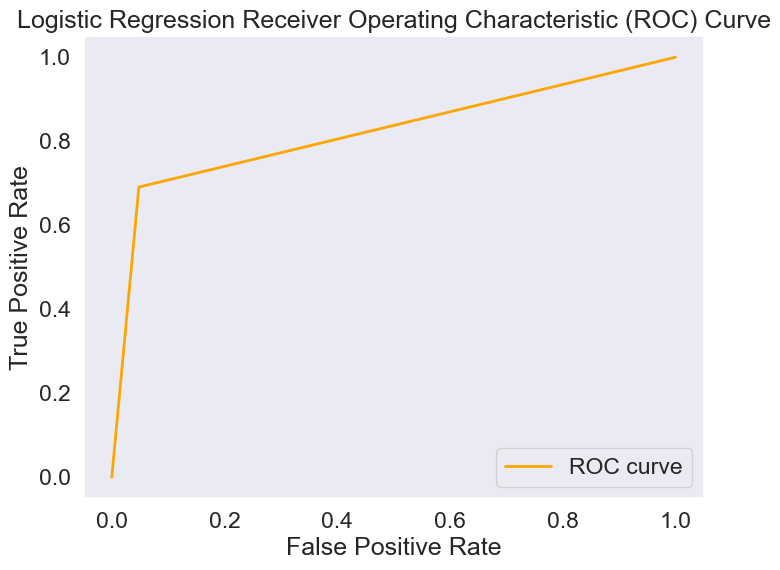


---------------------------------------------------

KNN
with 9 neighbors
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      4522
           1       0.79      0.42      0.55      1478

    accuracy                           0.83      6000
   macro avg       0.81      0.69      0.72      6000
weighted avg       0.82      0.83      0.81      6000

Test data accuracy:  0.829
Train data accuracy:  0.8655


<Figure size 800x600 with 0 Axes>

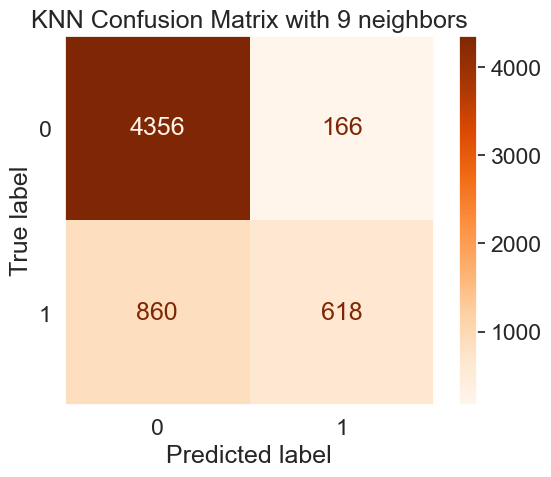

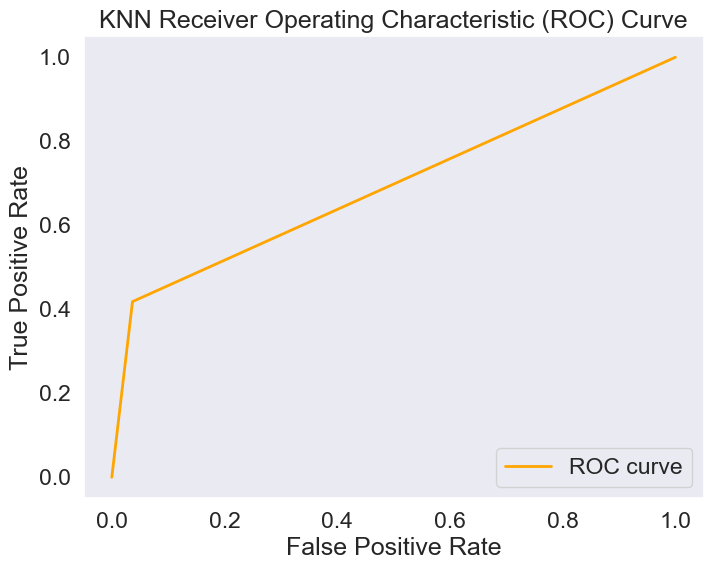


---------------------------------------------------

Decision Tree
with 10 maximum depth
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4522
           1       0.99      0.98      0.98      1478

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000

Test data accuracy:  0.9916666666666667
Train data accuracy:  0.9992857142857143


<Figure size 800x600 with 0 Axes>

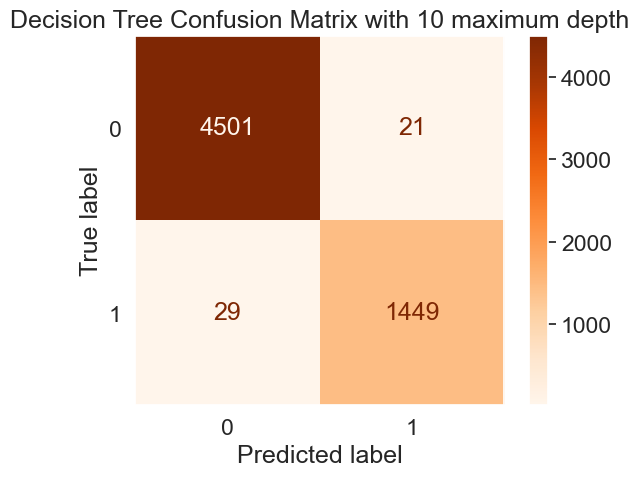

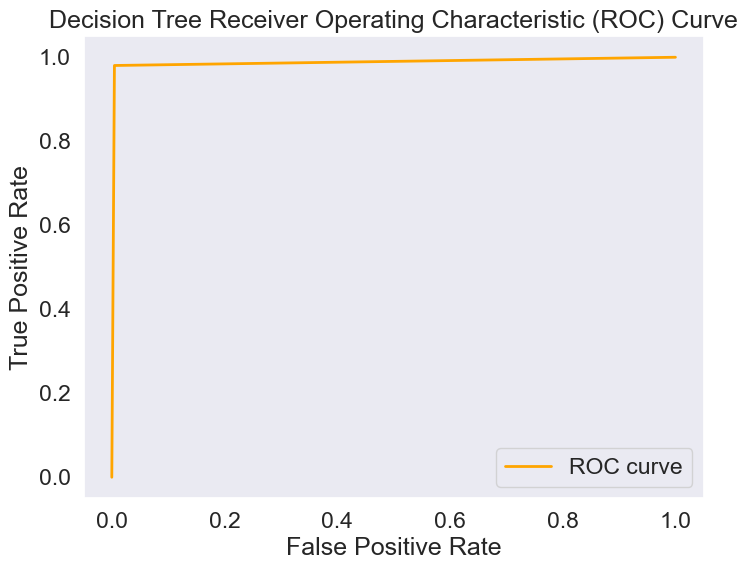


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.84      0.99      0.91      4522
           1       0.97      0.43      0.60      1478

    accuracy                           0.86      6000
   macro avg       0.90      0.71      0.75      6000
weighted avg       0.87      0.86      0.83      6000

Test data accuracy:  0.8561666666666666
Train data accuracy:  0.8584285714285714


<Figure size 800x600 with 0 Axes>

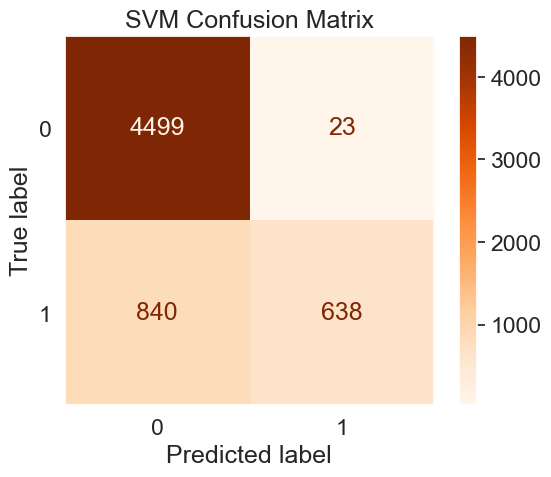

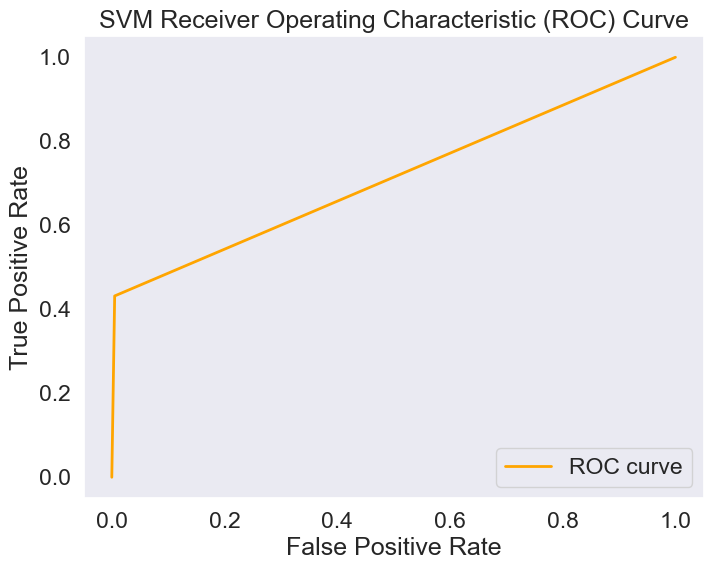


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4522
           1       1.00      1.00      1.00      1478

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000

Test data accuracy:  0.9983333333333333
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

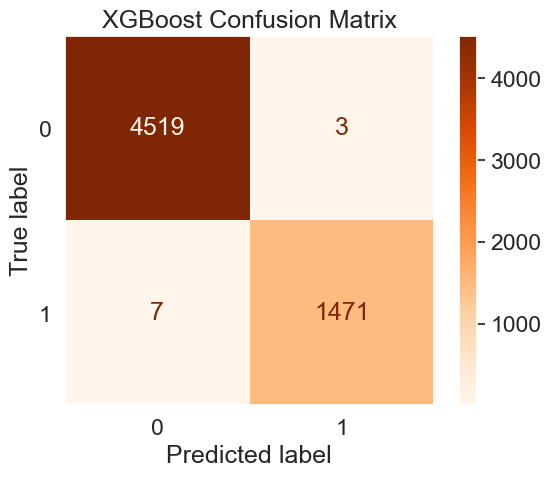

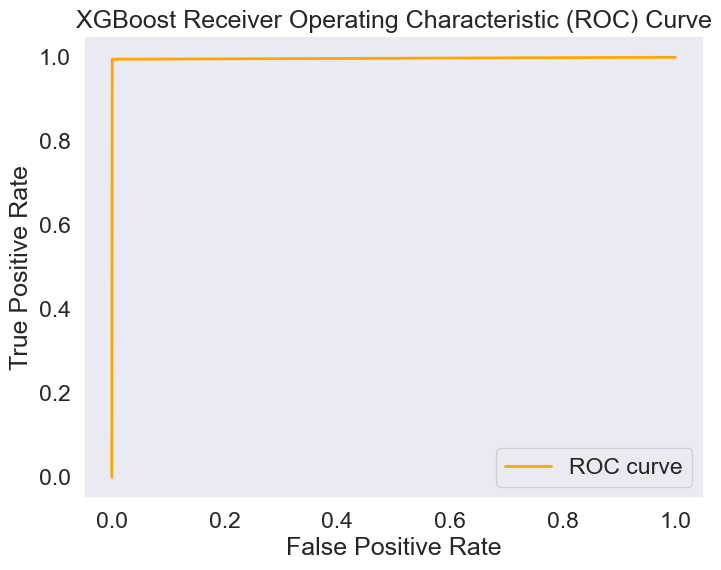

In [46]:
evaluate_clasification_model(dummy_clean_df, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Loan Approval (Clean Data without Risk Score)

In [42]:
clean_dummy_approved = dummy_clean_df.drop(columns="RiskScore")


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.90      0.95      0.93      4522
           1       0.82      0.69      0.75      1478

    accuracy                           0.89      6000
   macro avg       0.86      0.82      0.84      6000
weighted avg       0.88      0.89      0.88      6000

Test data accuracy:  0.8866666666666667
Train data accuracy:  0.8885714285714286


<Figure size 800x600 with 0 Axes>

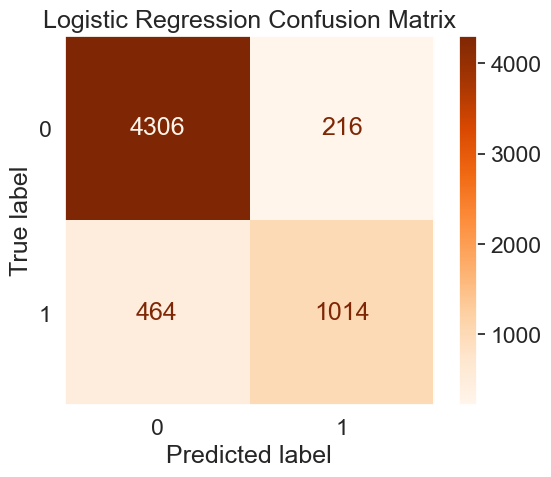

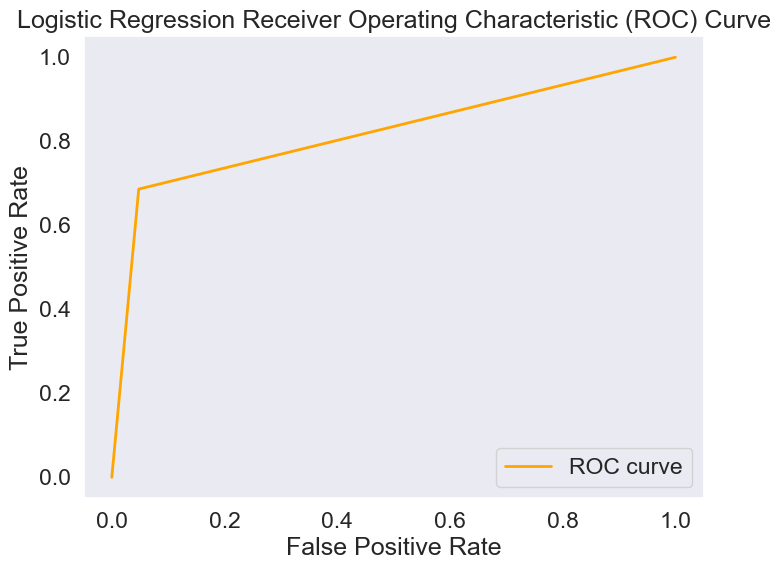


---------------------------------------------------

KNN
with 9 neighbors
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      4522
           1       0.79      0.42      0.55      1478

    accuracy                           0.83      6000
   macro avg       0.81      0.69      0.72      6000
weighted avg       0.82      0.83      0.81      6000

Test data accuracy:  0.829
Train data accuracy:  0.8655


<Figure size 800x600 with 0 Axes>

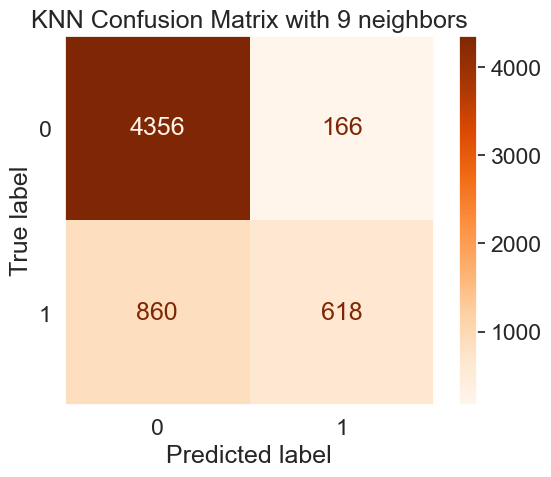

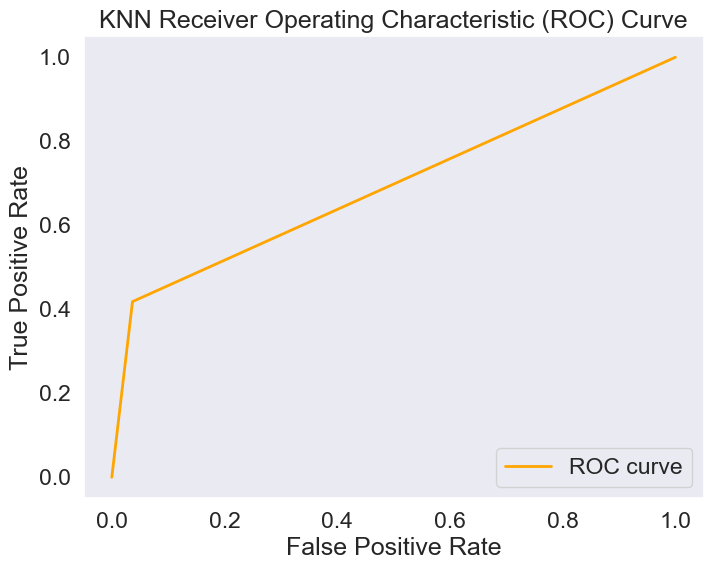


---------------------------------------------------

Decision Tree
with 6 maximum depth
              precision    recall  f1-score   support

           0       0.92      0.95      0.93      4522
           1       0.83      0.75      0.79      1478

    accuracy                           0.90      6000
   macro avg       0.87      0.85      0.86      6000
weighted avg       0.90      0.90      0.90      6000

Test data accuracy:  0.9005
Train data accuracy:  0.9187857142857143


<Figure size 800x600 with 0 Axes>

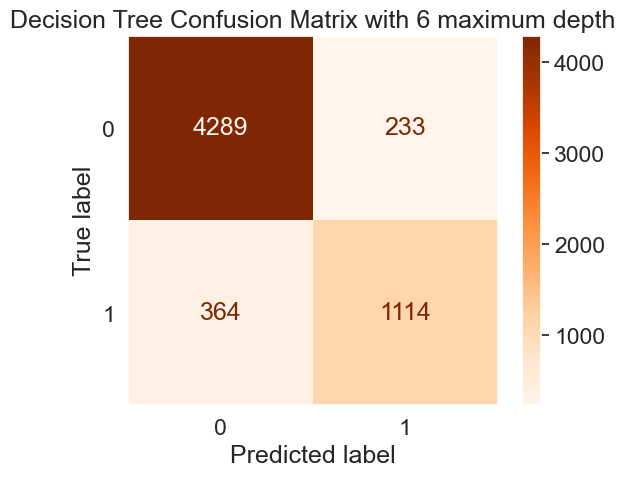

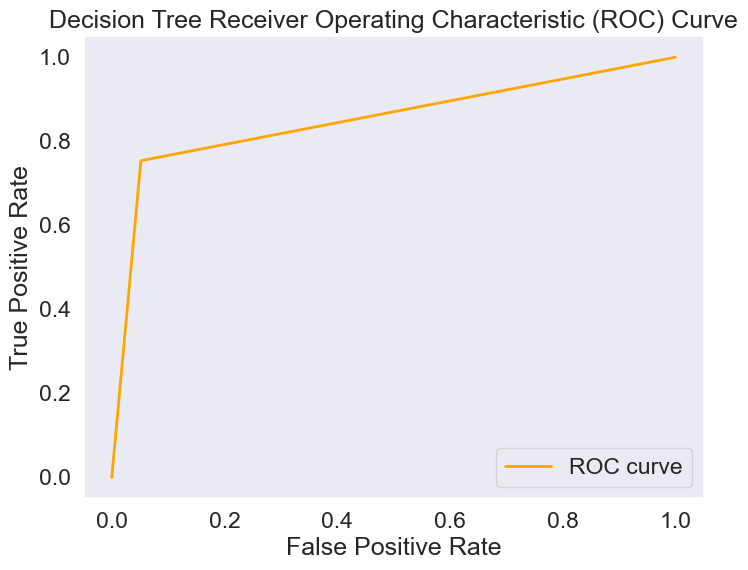


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.98      0.34      0.51      4522
           1       0.33      0.98      0.49      1478

    accuracy                           0.50      6000
   macro avg       0.65      0.66      0.50      6000
weighted avg       0.82      0.50      0.50      6000

Test data accuracy:  0.49933333333333335
Train data accuracy:  0.5004285714285714


<Figure size 800x600 with 0 Axes>

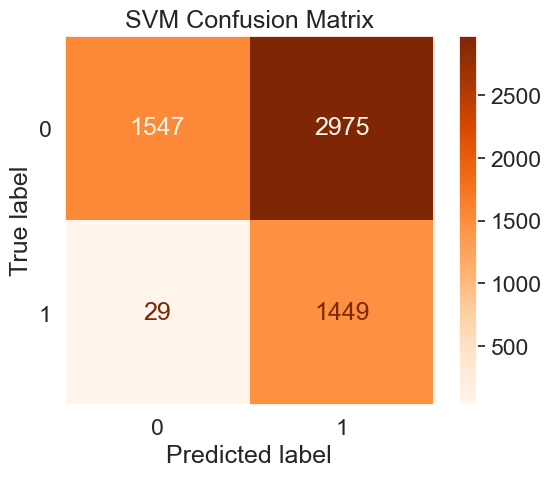

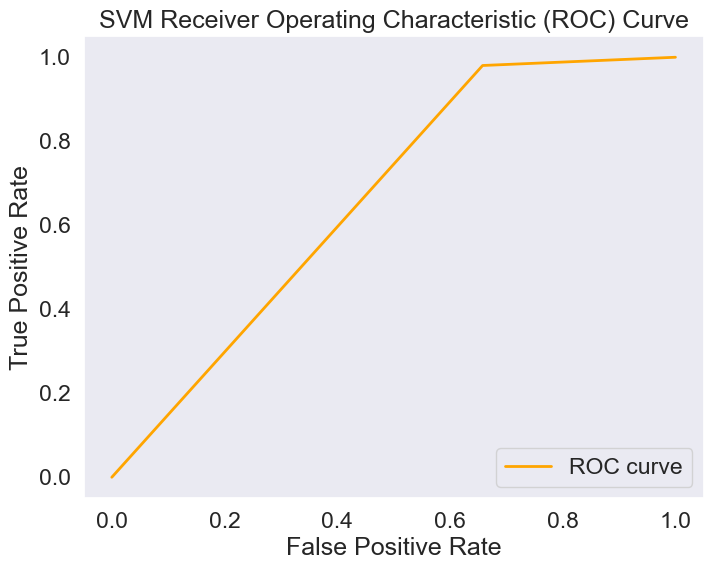


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      4522
           1       0.91      0.89      0.90      1478

    accuracy                           0.95      6000
   macro avg       0.94      0.93      0.93      6000
weighted avg       0.95      0.95      0.95      6000

Test data accuracy:  0.9505
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

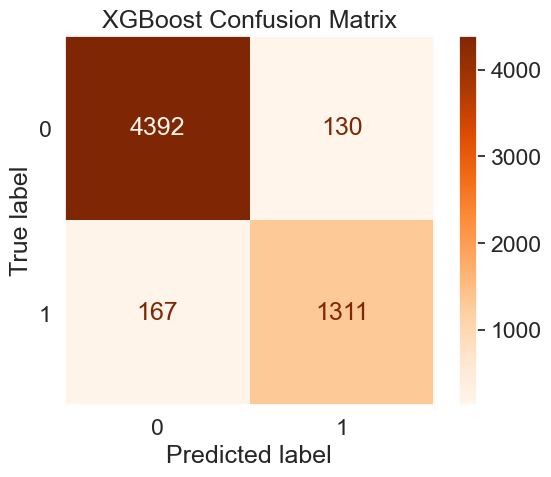

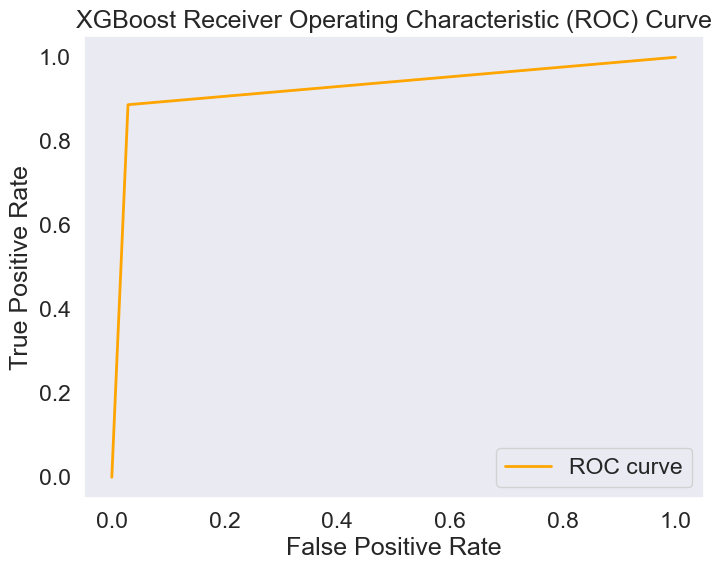

In [48]:
evaluate_clasification_model(clean_dummy_approved, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Risk Score (Clean Data without Loan Approval)

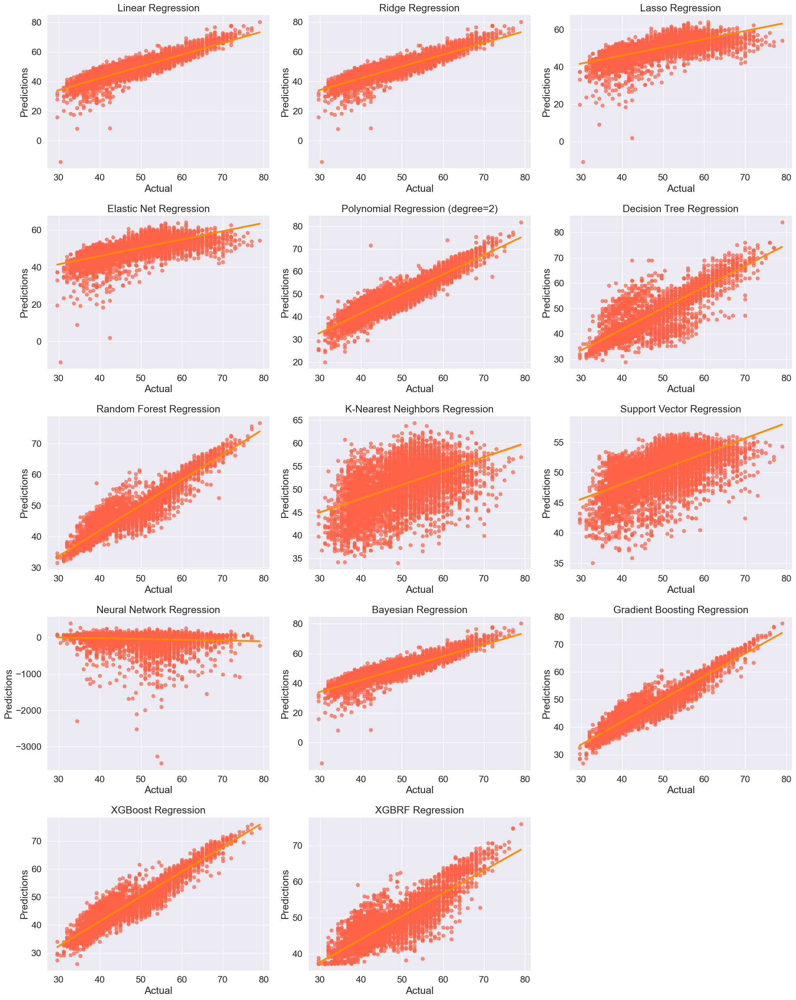

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7745,3.7152,13.8028,2.8606
Ridge Regression,0.7745,3.7150,13.8009,2.8576
Lasso Regression,0.4198,5.9596,35.5171,4.5741
Elastic Net Regression,0.4305,5.9044,34.8617,4.5379
Polynomial Regression (degree=2),0.8480,3.0503,9.3046,2.3546
Decision Tree Regression,0.7067,4.2374,17.9557,2.3525
Random Forest Regression,0.8769,2.7452,7.5363,1.7196
K-Nearest Neighbors Regression,0.2124,6.9433,48.2101,5.4093
Support Vector Regression,0.3103,6.4976,42.2185,5.0603


In [50]:
clean_dummy_risk = dummy_clean_df.drop(columns="LoanApproved")
evaluate_regresion_model(clean_dummy_risk, "RiskScore", graphs=True).T

### We try to Log Transform to check for improvement

----------------------Data Normalized with Log Transform-------------------------


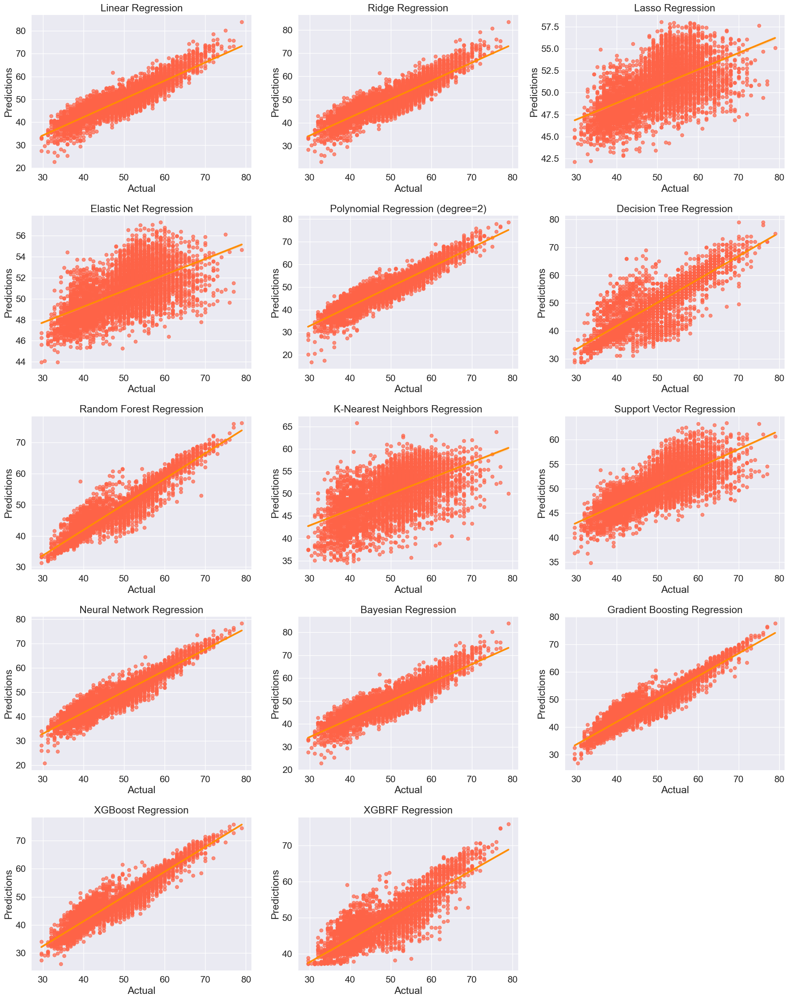

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7983,3.5137,12.3464,2.8163
Ridge Regression,0.7943,3.5480,12.5882,2.8478
Lasso Regression,0.2675,6.6959,44.8354,5.2284
Elastic Net Regression,0.2327,6.8532,46.9660,5.3301
Polynomial Regression (degree=2),0.8568,2.9604,8.7637,2.3059
Decision Tree Regression,0.7052,4.2478,18.0439,2.3534
Random Forest Regression,0.8765,2.7490,7.5572,1.7164
K-Nearest Neighbors Regression,0.3395,6.3587,40.4333,4.8801
Support Vector Regression,0.4917,5.5778,31.1123,4.3565


In [51]:
evaluate_regresion_model(clean_dummy_risk, "RiskScore", graphs=True,log=True).T

### We try to normalize the data with Standard Scaler to check for improvement

----------------------Data Normalized with Standard Scaler-------------------------


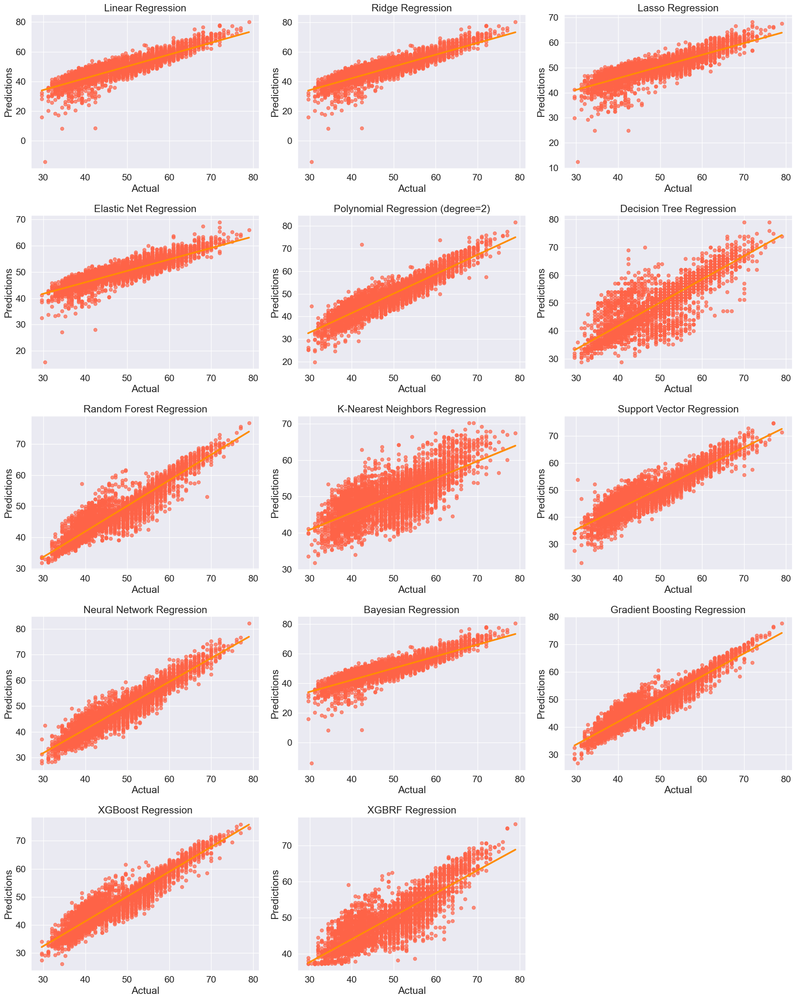

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7743,3.7170,13.8163,2.8615
Ridge Regression,0.7745,3.7152,13.8025,2.8606
Lasso Regression,0.6249,4.7915,22.9587,3.7843
Elastic Net Regression,0.6183,4.8340,23.3671,3.8559
Polynomial Regression (degree=2),0.8473,3.0571,9.3459,2.3628
Decision Tree Regression,0.7152,4.1751,17.4318,2.3221
Random Forest Regression,0.8769,2.7450,7.5349,1.7225
K-Nearest Neighbors Regression,0.5130,5.4600,29.8112,4.3022
Support Vector Regression,0.8188,3.3301,11.0894,2.4684


In [52]:
evaluate_regresion_model(clean_dummy_risk, "RiskScore", graphs=True,stand=True).T

# Let's try downsampling

In [54]:
clean_downsampled_dummy_df = dummy_clean_df.copy()

In [56]:
clean_downsampled_dummy_df.LoanApproved.value_counts()

LoanApproved
0    15220
1     4780
Name: count, dtype: int64

In [57]:
approved=clean_downsampled_dummy_df[clean_downsampled_dummy_df.LoanApproved == 1]
denied=clean_downsampled_dummy_df[clean_downsampled_dummy_df.LoanApproved == 0]
denied = denied.sample(4780)
clean_downsampled_dummy_df = pd.concat([approved, denied])

In [66]:
clean_downsampled_dummy_df.LoanApproved.value_counts()

LoanApproved
1    4780
0    4780
Name: count, dtype: int64

# ML Model to predict Loan Approval (Downsampled Clean Data with Risk Score)


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.87      0.88      0.88      1426
           1       0.88      0.87      0.88      1442

    accuracy                           0.88      2868
   macro avg       0.88      0.88      0.88      2868
weighted avg       0.88      0.88      0.88      2868

Test data accuracy:  0.8751743375174338
Train data accuracy:  0.8722355050806934


<Figure size 800x600 with 0 Axes>

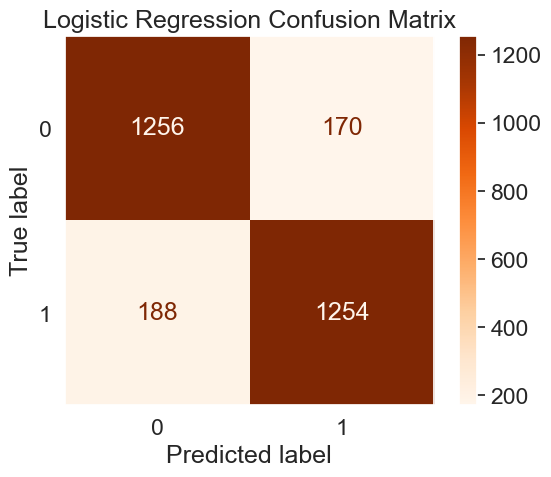

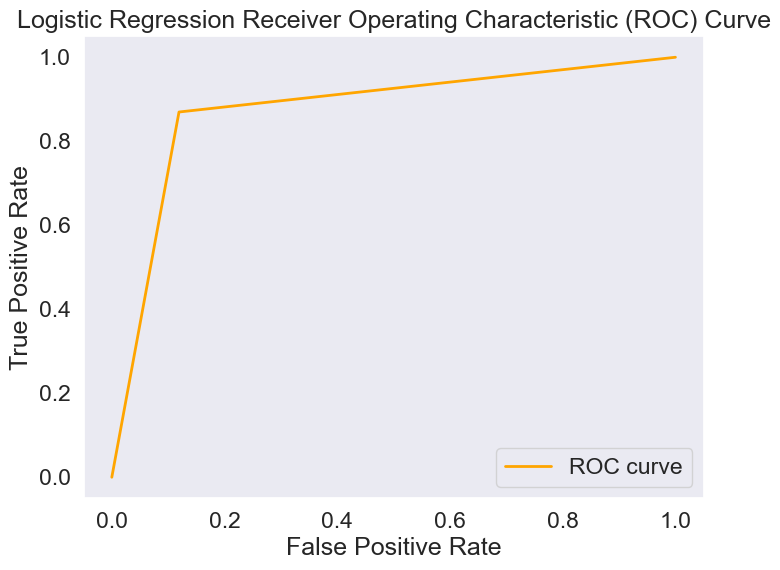


---------------------------------------------------

KNN
with 7 neighbors
              precision    recall  f1-score   support

           0       0.77      0.79      0.78      1426
           1       0.79      0.77      0.78      1442

    accuracy                           0.78      2868
   macro avg       0.78      0.78      0.78      2868
weighted avg       0.78      0.78      0.78      2868

Test data accuracy:  0.7789400278940027
Train data accuracy:  0.8401075911536162


<Figure size 800x600 with 0 Axes>

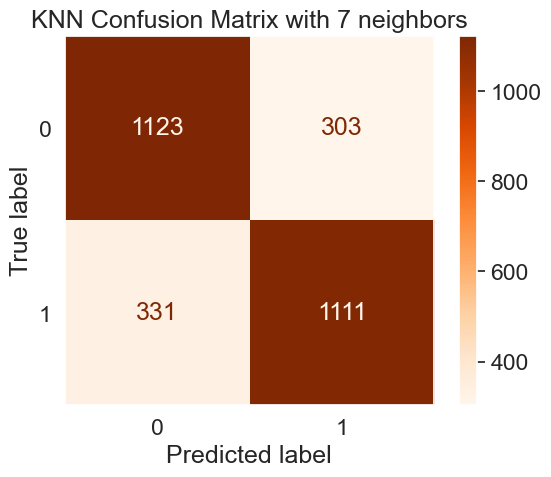

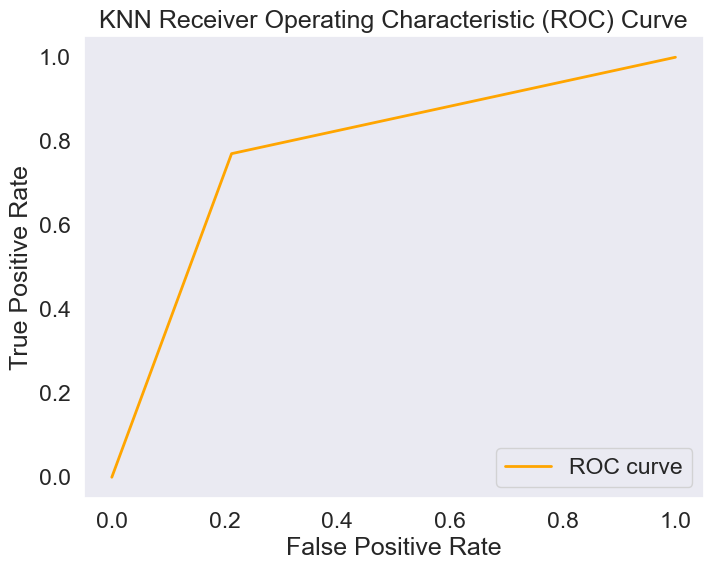


---------------------------------------------------

Decision Tree
with 9 maximum depth
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1426
           1       0.98      0.98      0.98      1442

    accuracy                           0.98      2868
   macro avg       0.98      0.98      0.98      2868
weighted avg       0.98      0.98      0.98      2868

Test data accuracy:  0.9832635983263598
Train data accuracy:  0.9986551105797967


<Figure size 800x600 with 0 Axes>

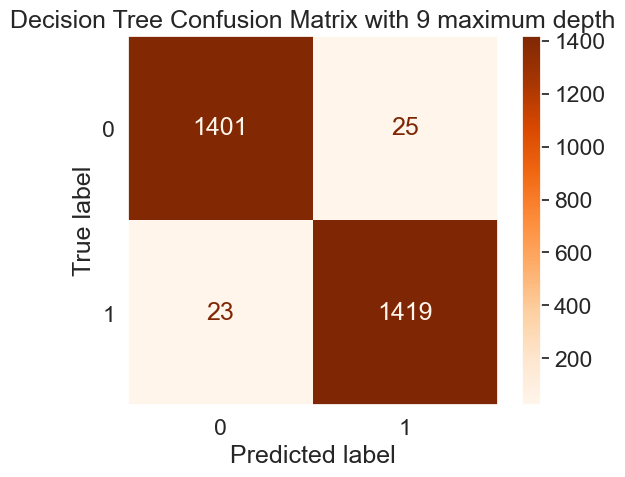

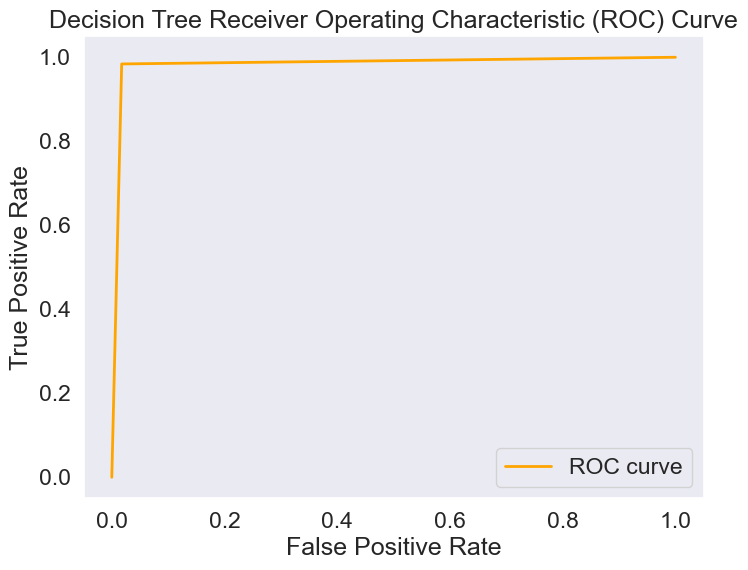


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.64      0.98      0.78      1426
           1       0.96      0.46      0.62      1442

    accuracy                           0.72      2868
   macro avg       0.80      0.72      0.70      2868
weighted avg       0.80      0.72      0.70      2868

Test data accuracy:  0.7193165969316597
Train data accuracy:  0.7213090257023311


<Figure size 800x600 with 0 Axes>

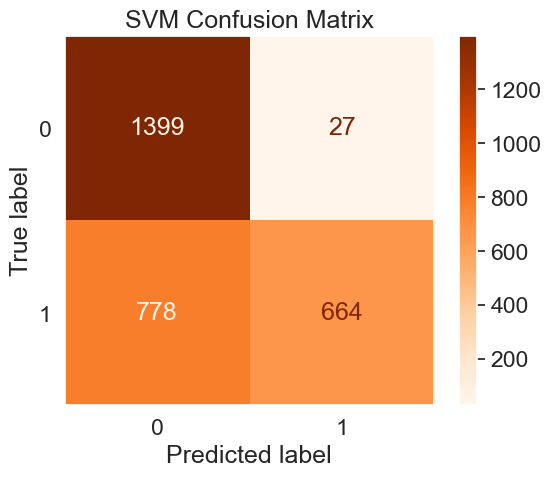

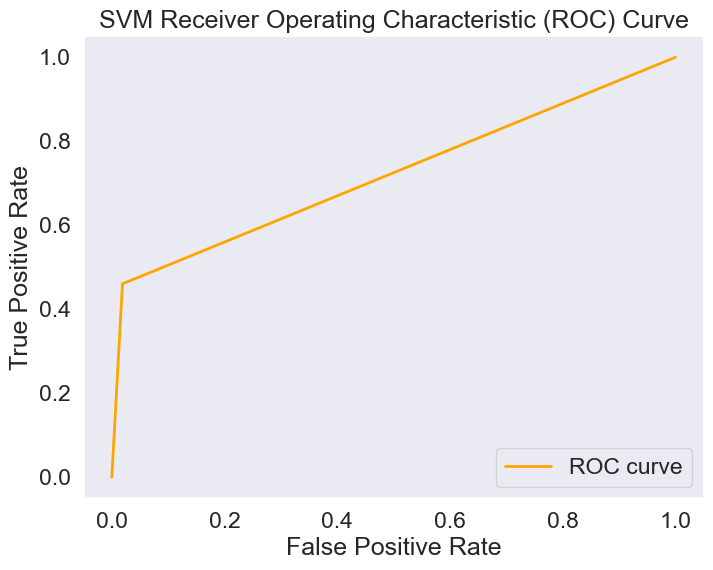


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1426
           1       0.99      0.99      0.99      1442

    accuracy                           0.99      2868
   macro avg       0.99      0.99      0.99      2868
weighted avg       0.99      0.99      0.99      2868

Test data accuracy:  0.9944211994421199
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

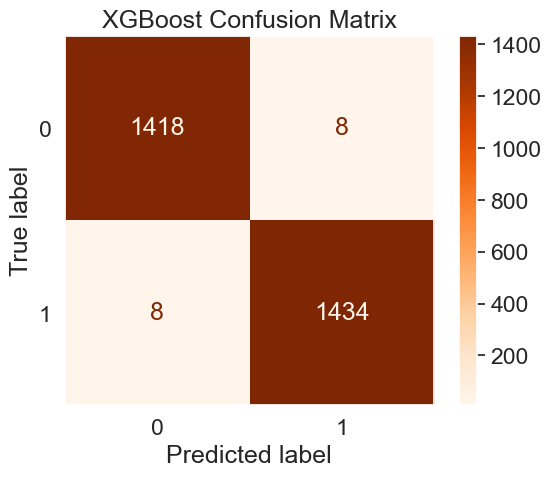

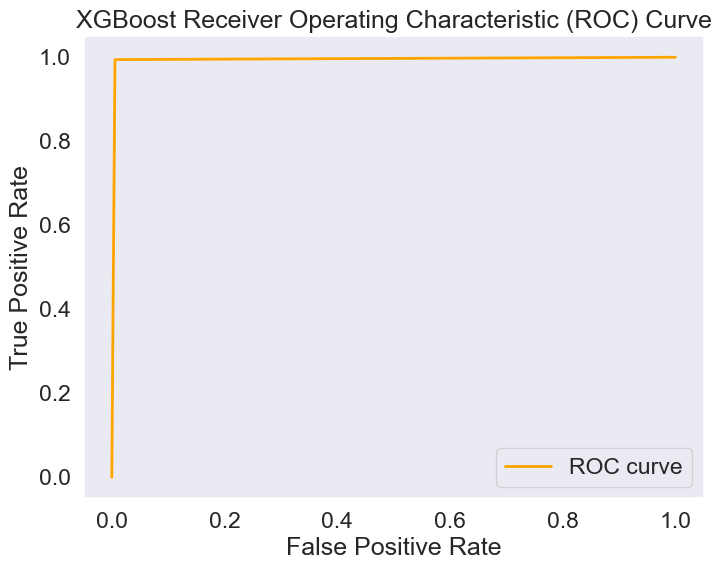

In [58]:
evaluate_clasification_model(clean_downsampled_dummy_df, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Loan Approval (Downsampled Clean Data without Risk Score)

In [59]:
clean_downsampled_dummy_approved = clean_downsampled_dummy_df.drop(columns="RiskScore")


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1426
           1       0.88      0.87      0.87      1442

    accuracy                           0.87      2868
   macro avg       0.87      0.87      0.87      2868
weighted avg       0.87      0.87      0.87      2868

Test data accuracy:  0.8720362622036262
Train data accuracy:  0.8716377764494919


<Figure size 800x600 with 0 Axes>

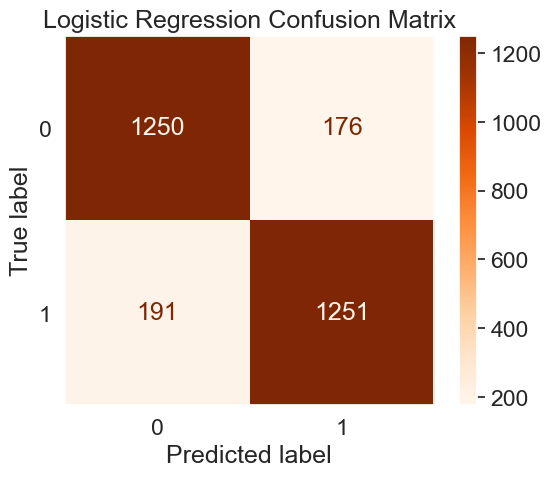

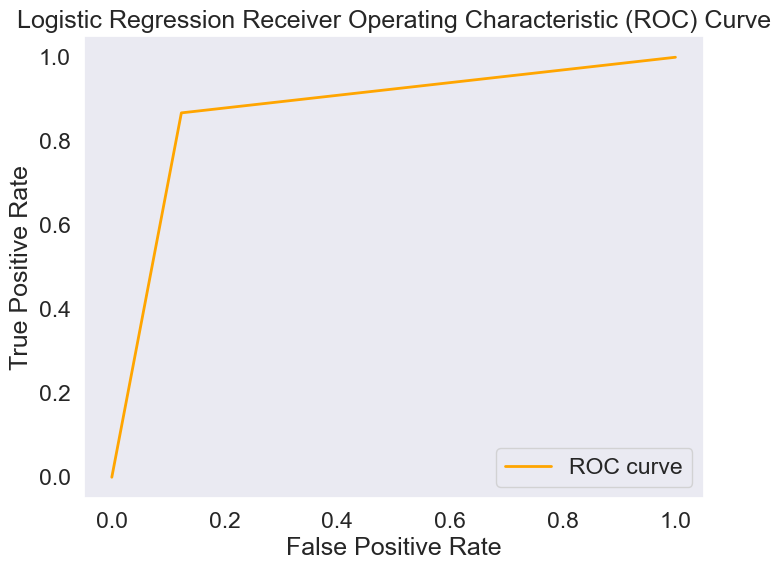


---------------------------------------------------

KNN
with 7 neighbors
              precision    recall  f1-score   support

           0       0.77      0.79      0.78      1426
           1       0.79      0.77      0.78      1442

    accuracy                           0.78      2868
   macro avg       0.78      0.78      0.78      2868
weighted avg       0.78      0.78      0.78      2868

Test data accuracy:  0.7789400278940027
Train data accuracy:  0.8401075911536162


<Figure size 800x600 with 0 Axes>

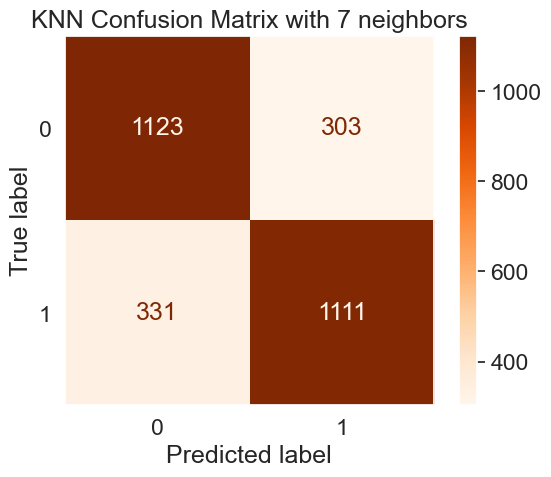

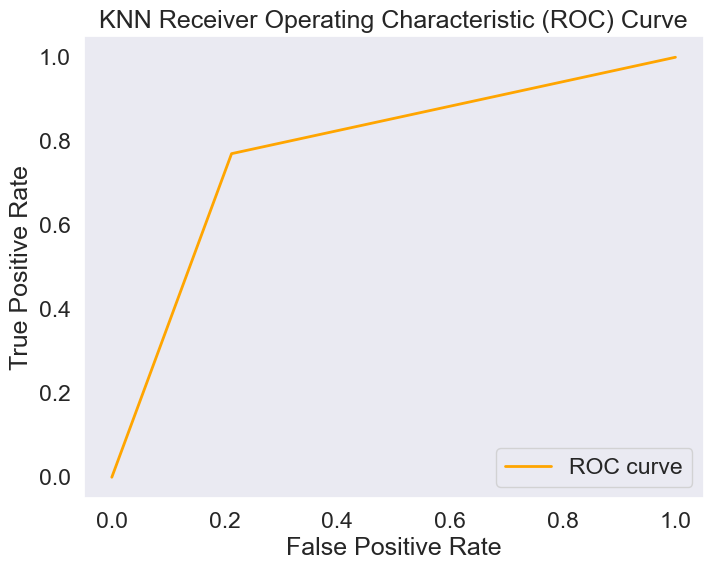


---------------------------------------------------

Decision Tree
with 6 maximum depth
              precision    recall  f1-score   support

           0       0.91      0.86      0.88      1426
           1       0.87      0.91      0.89      1442

    accuracy                           0.89      2868
   macro avg       0.89      0.89      0.89      2868
weighted avg       0.89      0.89      0.89      2868

Test data accuracy:  0.8870292887029289
Train data accuracy:  0.9094441123729826


<Figure size 800x600 with 0 Axes>

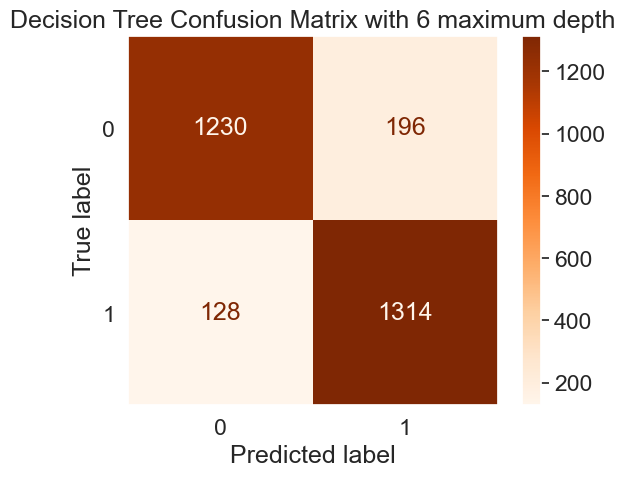

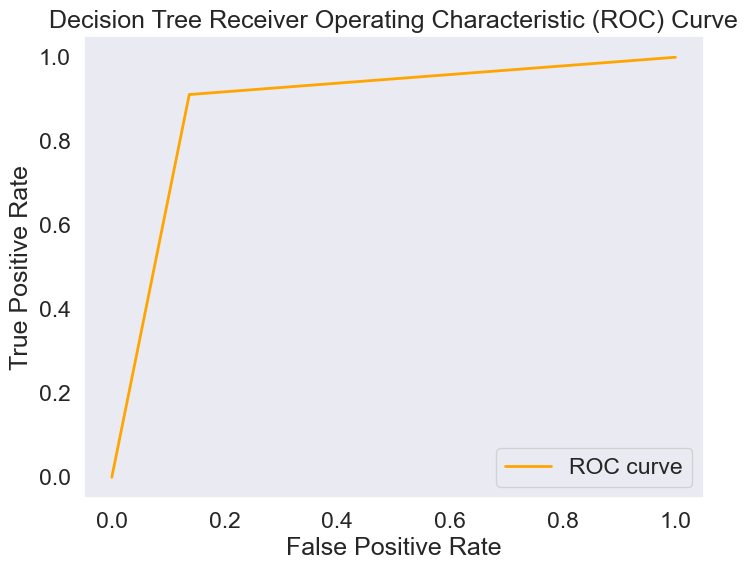


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.79      0.85      0.82      1426
           1       0.84      0.77      0.80      1442

    accuracy                           0.81      2868
   macro avg       0.81      0.81      0.81      2868
weighted avg       0.81      0.81      0.81      2868

Test data accuracy:  0.8092747559274756
Train data accuracy:  0.8181410639569635


<Figure size 800x600 with 0 Axes>

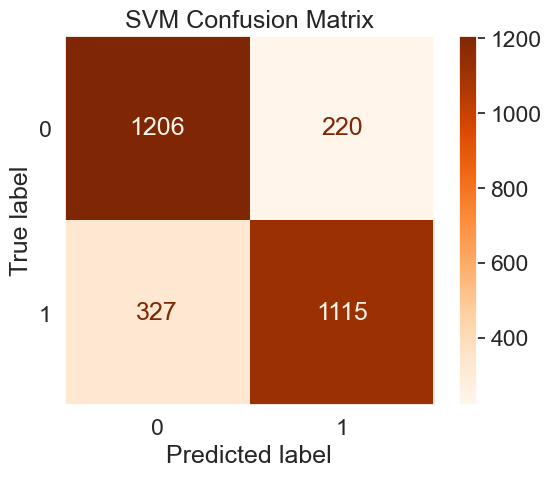

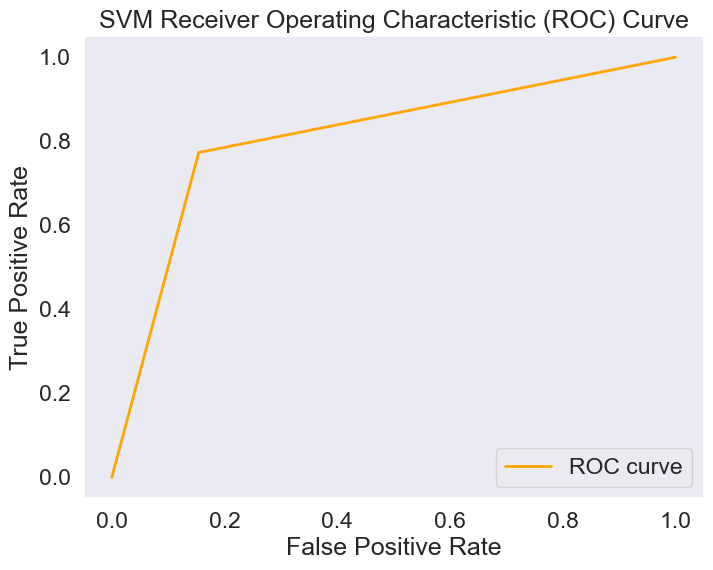


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1426
           1       0.93      0.97      0.95      1442

    accuracy                           0.95      2868
   macro avg       0.95      0.95      0.95      2868
weighted avg       0.95      0.95      0.95      2868

Test data accuracy:  0.9456066945606695
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

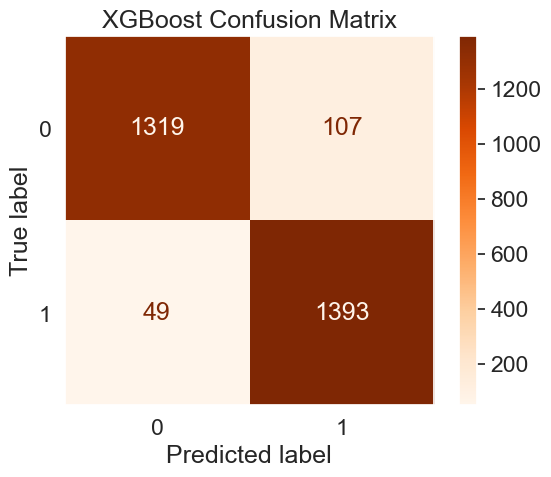

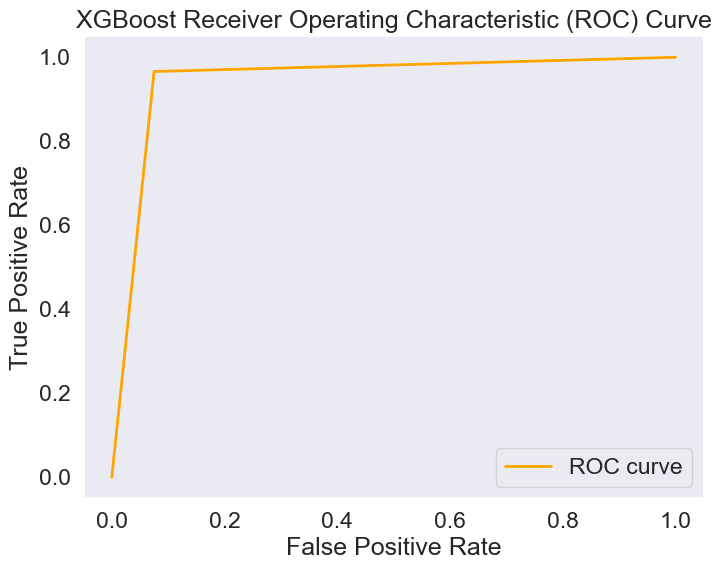

In [60]:
evaluate_clasification_model(clean_downsampled_dummy_approved, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Risk Score (Downsampled Clean Data without Loan Approval)

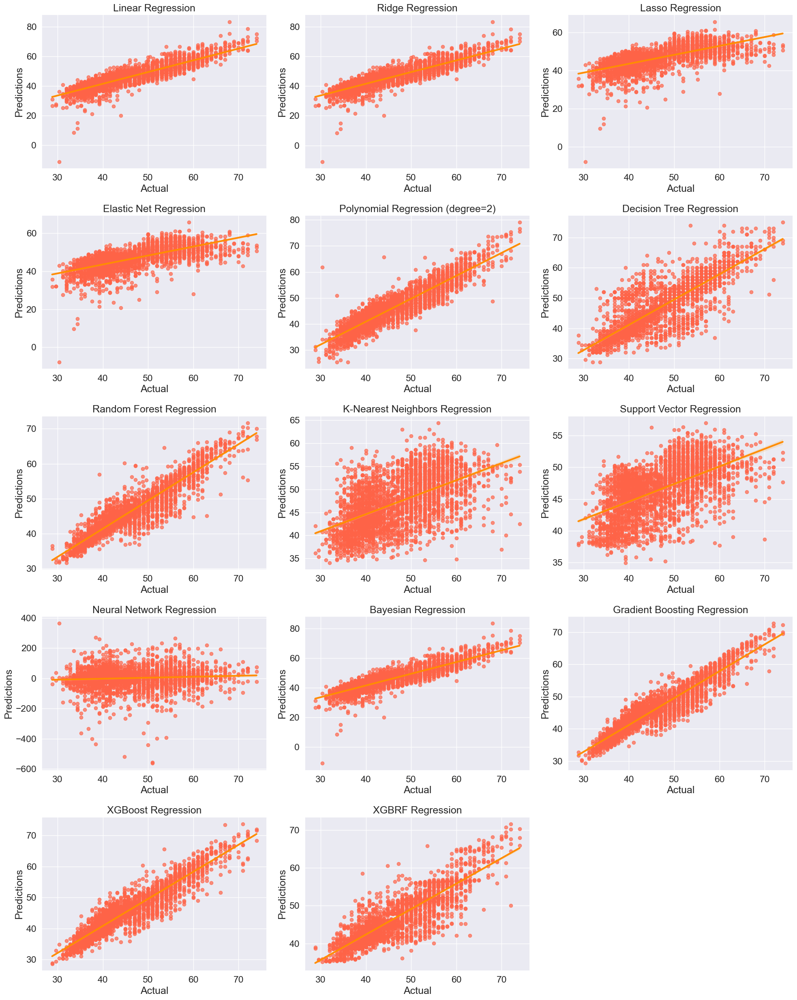

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7662,4.0890,16.7200,3.3083
Ridge Regression,0.7654,4.0962,16.7788,3.3216
Lasso Regression,0.4552,6.2424,38.9673,4.8231
Elastic Net Regression,0.4592,6.2190,38.6758,4.8066
Polynomial Regression (degree=2),0.8419,3.3628,11.3084,2.6471
Decision Tree Regression,0.6634,4.9062,24.0706,3.0610
Random Forest Regression,0.8656,3.1007,9.6146,2.1160
K-Nearest Neighbors Regression,0.2867,7.1423,51.0130,5.5764
Support Vector Regression,0.3187,6.9804,48.7261,5.6016


In [61]:
clean_downsampled_dummy_risk = clean_downsampled_dummy_df.drop(columns="LoanApproved")
evaluate_regresion_model(clean_downsampled_dummy_risk, "RiskScore", graphs=True).T

### We try to Log Transform to check for improvement

----------------------Data Normalized with Log Transform-------------------------


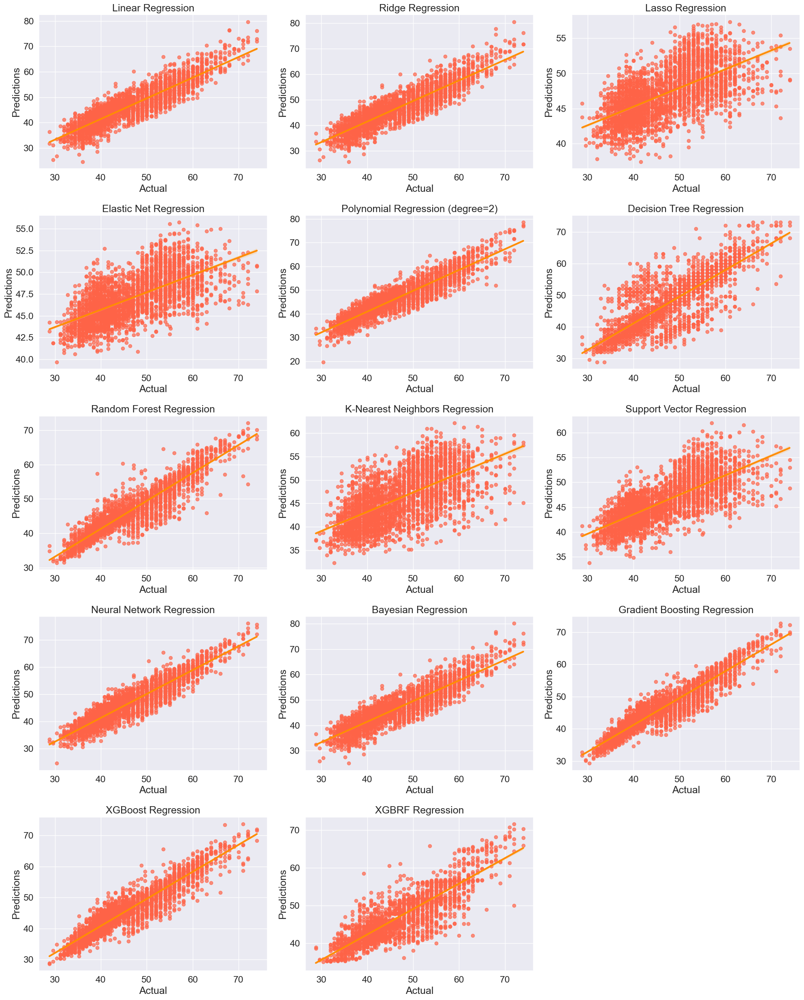

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.8087,3.6990,13.6829,3.0253
Ridge Regression,0.8051,3.7336,13.9397,3.0541
Lasso Regression,0.3500,6.8181,46.4871,5.4751
Elastic Net Regression,0.3046,7.0523,49.7348,5.7786
Polynomial Regression (degree=2),0.8493,3.2835,10.7815,2.6173
Decision Tree Regression,0.6713,4.8486,23.5090,3.0039
Random Forest Regression,0.8676,3.0771,9.4687,2.0892
K-Nearest Neighbors Regression,0.3930,6.5890,43.4151,5.0476
Support Vector Regression,0.4877,6.0530,36.6382,4.7005


In [62]:
evaluate_regresion_model(clean_downsampled_dummy_risk, "RiskScore", graphs=True,log=True).T

### We try to normalize the data with Standard Scaler to check for improvement

----------------------Data Normalized with Standard Scaler-------------------------


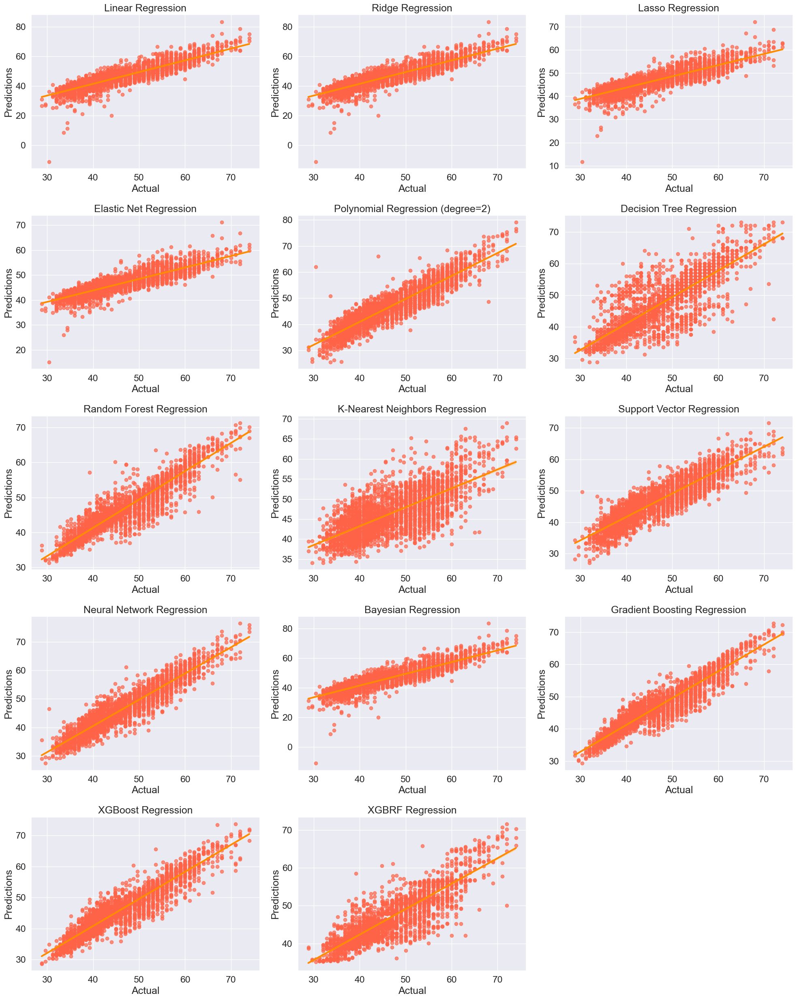

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7663,4.0884,16.7150,3.3089
Ridge Regression,0.7662,4.0889,16.7194,3.3083
Lasso Regression,0.6419,5.0605,25.6091,4.2604
Elastic Net Regression,0.6353,5.1074,26.0858,4.3581
Polynomial Regression (degree=2),0.8423,3.3587,11.2806,2.6437
Decision Tree Regression,0.6714,4.8475,23.4984,3.0028
Random Forest Regression,0.8663,3.0922,9.5619,2.0962
K-Nearest Neighbors Regression,0.5037,5.9577,35.4946,4.7573
Support Vector Regression,0.8044,3.7399,13.9868,2.9735


In [63]:
evaluate_regresion_model(clean_downsampled_dummy_risk, "RiskScore", graphs=True,stand=True).T

# Now upsampling with SMOTE

In [10]:
dummy_clean_df["LoanApproved"] = dummy_clean_df.pop("LoanApproved")

In [11]:
clean_upsampled_dummy_df = dummy_clean_df.copy()

In [12]:
clean_upsampled_dummy_df.LoanApproved.value_counts()

LoanApproved
0    15220
1     4780
Name: count, dtype: int64

In [13]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
smote = SMOTE()
X = clean_upsampled_dummy_df.drop(columns=['LoanApproved'])
transformer = StandardScaler().fit(X)
X = transformer.transform(X)
y = clean_upsampled_dummy_df['LoanApproved']
X_sm, y_sm = smote.fit_resample(X, y)
clean_upsampled_dummy_df = pd.concat([pd.DataFrame(X_sm), pd.DataFrame(y_sm)], axis=1)

In [14]:
clean_upsampled_dummy_df.columns = dummy_clean_df.columns

In [19]:
clean_upsampled_dummy_df.LoanApproved.value_counts()

LoanApproved
0    15220
1    15220
Name: count, dtype: int64

# ML Model to predict Loan Approval (Upsampled Clean Data with Risk Score)


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4564
           1       1.00      1.00      1.00      4568

    accuracy                           1.00      9132
   macro avg       1.00      1.00      1.00      9132
weighted avg       1.00      1.00      1.00      9132

Test data accuracy:  0.9998904949627683
Train data accuracy:  0.9999061385395157


<Figure size 800x600 with 0 Axes>

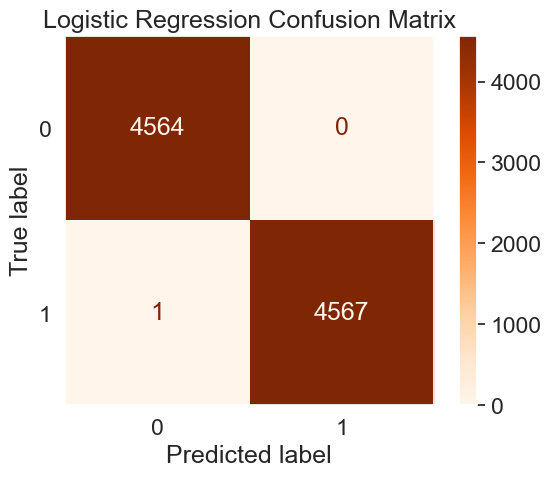

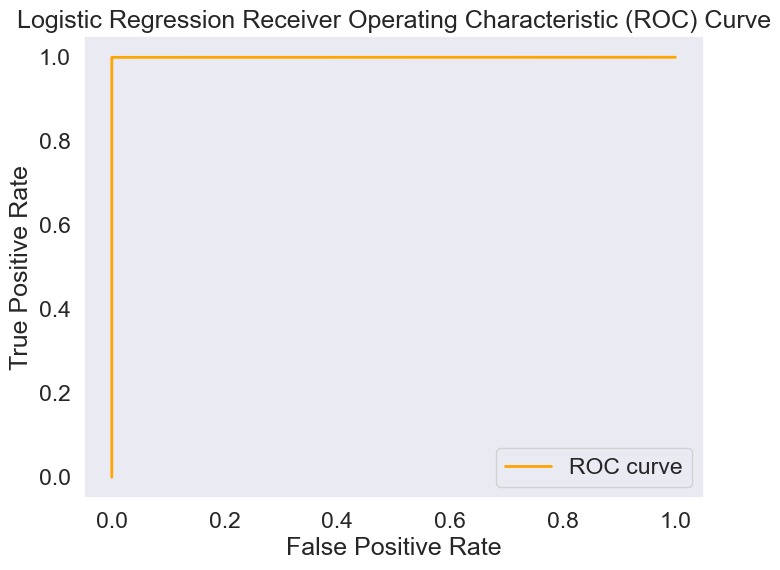


---------------------------------------------------

KNN
with 6 neighbors
              precision    recall  f1-score   support

           0       0.98      0.84      0.90      4564
           1       0.86      0.98      0.91      4568

    accuracy                           0.91      9132
   macro avg       0.92      0.91      0.91      9132
weighted avg       0.92      0.91      0.91      9132

Test data accuracy:  0.9087823039859834
Train data accuracy:  0.9417120330392341


<Figure size 800x600 with 0 Axes>

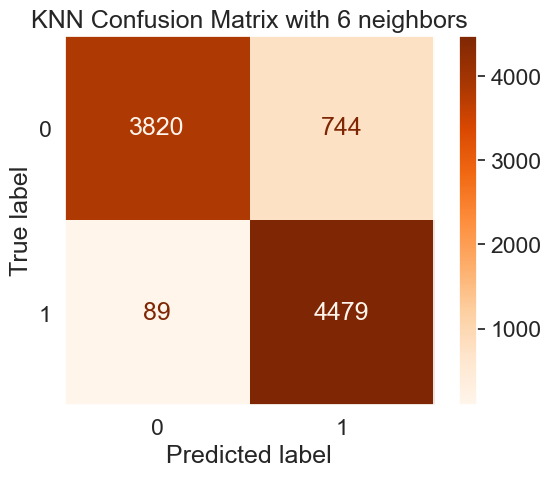

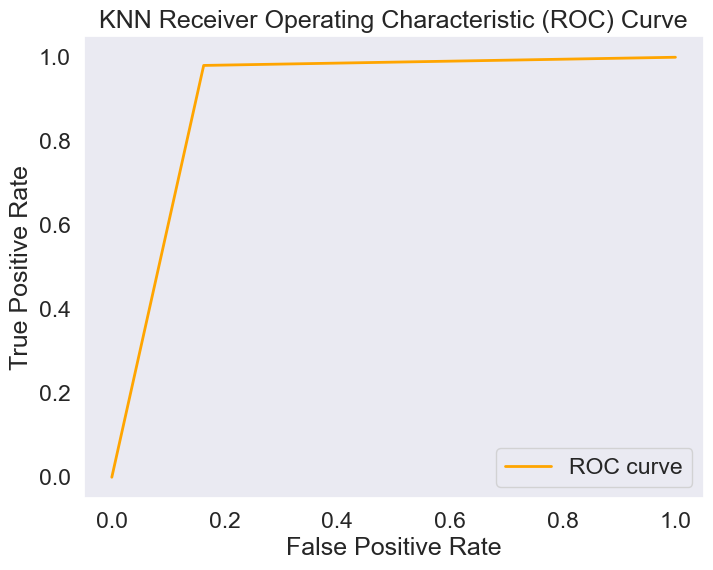


---------------------------------------------------

Decision Tree
with 11 maximum depth
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4564
           1       0.99      0.99      0.99      4568

    accuracy                           0.99      9132
   macro avg       0.99      0.99      0.99      9132
weighted avg       0.99      0.99      0.99      9132

Test data accuracy:  0.9923346473937801
Train data accuracy:  0.9995306926975783


<Figure size 800x600 with 0 Axes>

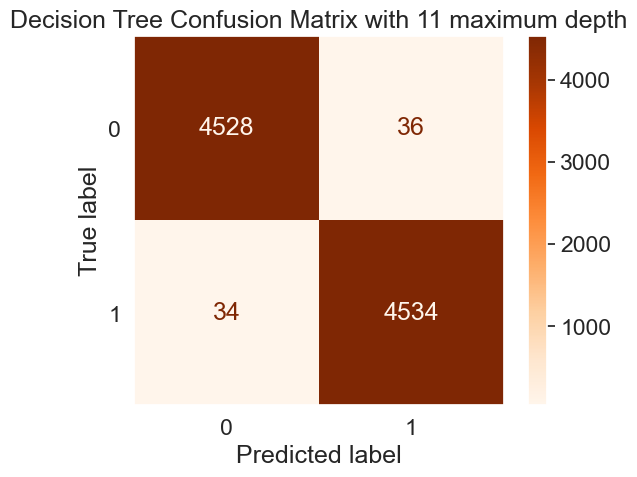

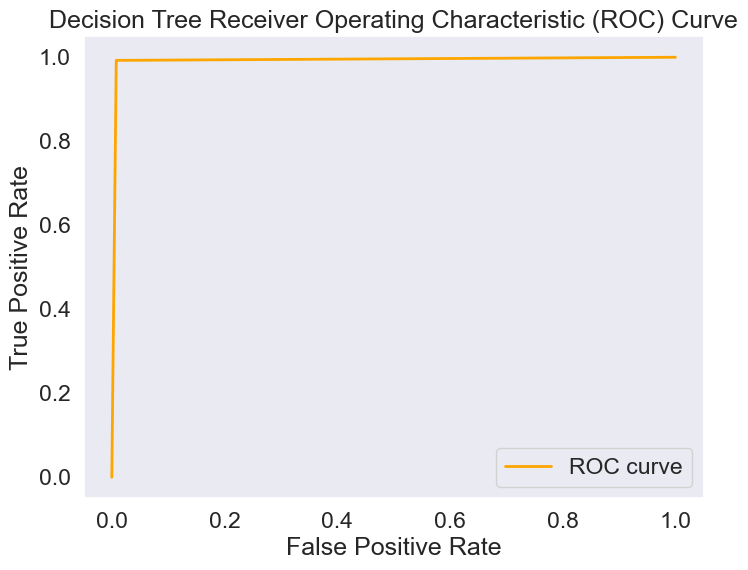


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4564
           1       1.00      1.00      1.00      4568

    accuracy                           1.00      9132
   macro avg       1.00      1.00      1.00      9132
weighted avg       1.00      1.00      1.00      9132

Test data accuracy:  0.9997809899255365
Train data accuracy:  0.9999530692697578


<Figure size 800x600 with 0 Axes>

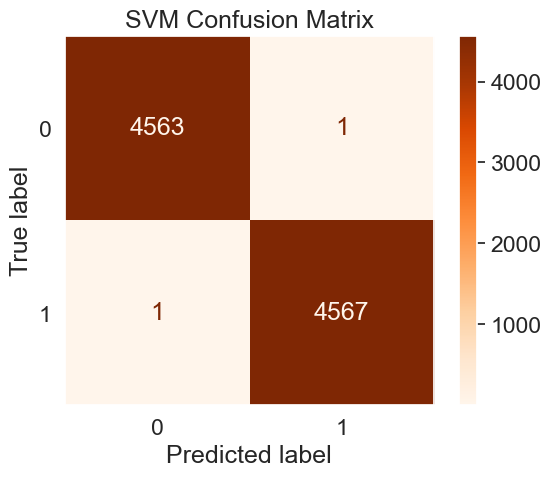

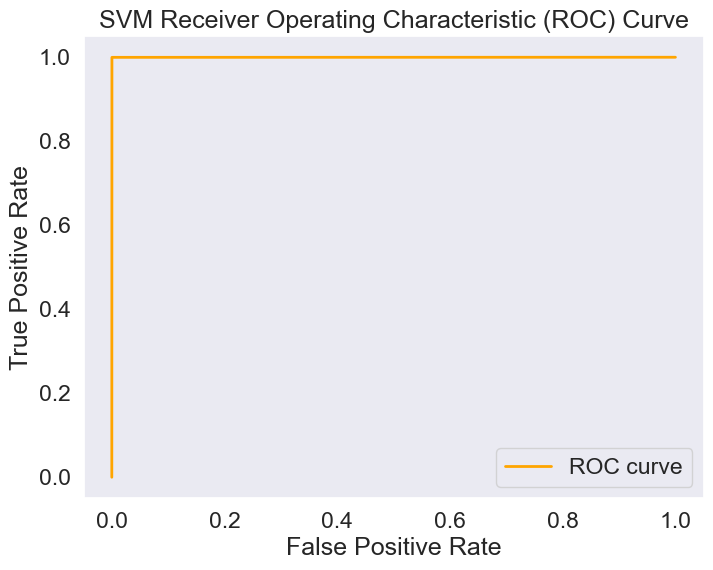


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4564
           1       1.00      1.00      1.00      4568

    accuracy                           1.00      9132
   macro avg       1.00      1.00      1.00      9132
weighted avg       1.00      1.00      1.00      9132

Test data accuracy:  0.9990144546649146
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

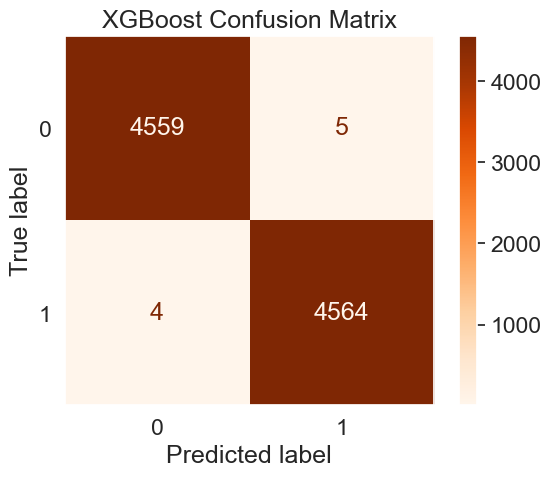

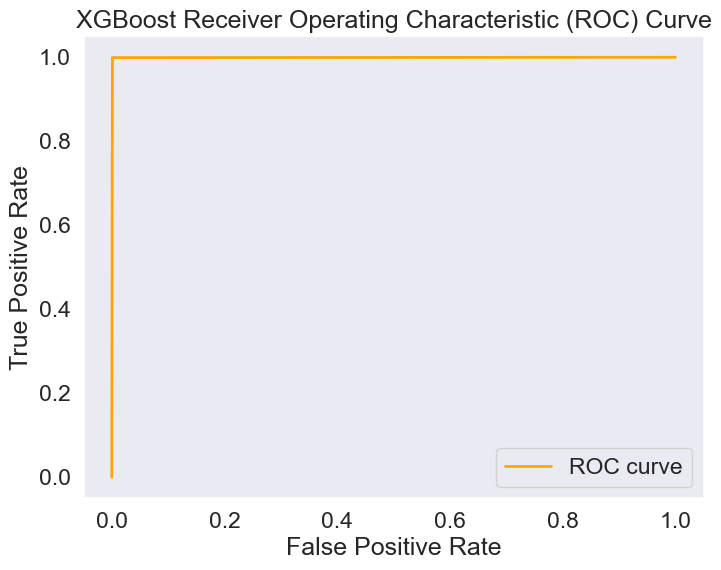

In [76]:
evaluate_clasification_model(clean_upsampled_dummy_df, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Loan Approval (Upsampled Clean Data without Risk Score)

In [15]:
clean_upsampled_dummy_approved = clean_upsampled_dummy_df.drop(columns="RiskScore")


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      4564
           1       0.96      0.98      0.97      4568

    accuracy                           0.97      9132
   macro avg       0.97      0.97      0.97      9132
weighted avg       0.97      0.97      0.97      9132

Test data accuracy:  0.9703241349102059
Train data accuracy:  0.97113760090107


<Figure size 800x600 with 0 Axes>

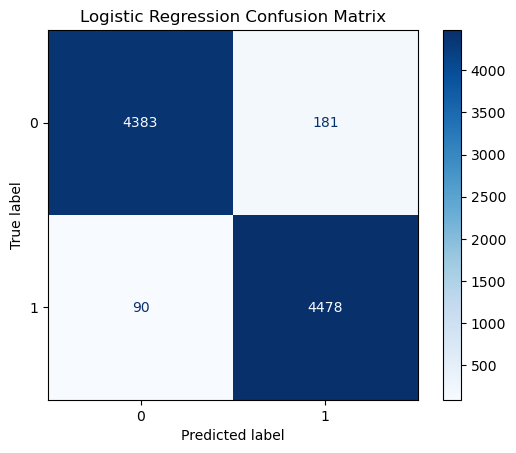

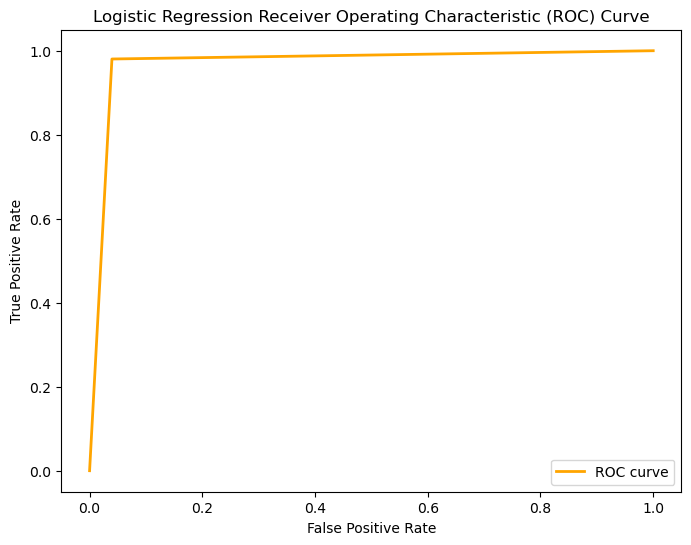


---------------------------------------------------

KNN
with 6 neighbors
              precision    recall  f1-score   support

           0       0.95      0.75      0.84      4564
           1       0.79      0.96      0.87      4568

    accuracy                           0.85      9132
   macro avg       0.87      0.85      0.85      9132
weighted avg       0.87      0.85      0.85      9132

Test data accuracy:  0.8545773105562856
Train data accuracy:  0.9014923972217007


<Figure size 800x600 with 0 Axes>

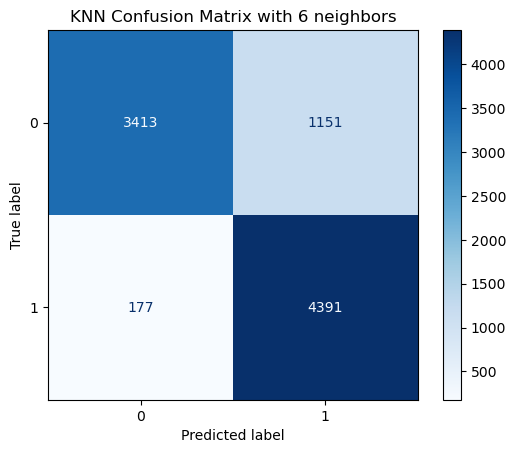

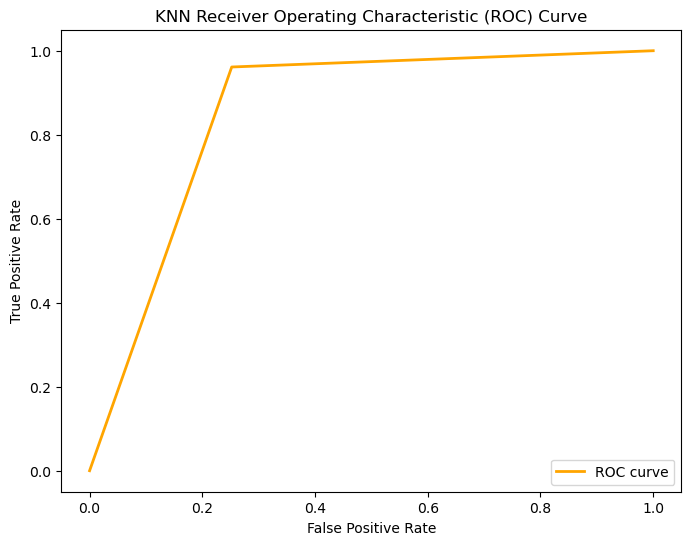


---------------------------------------------------

Decision Tree
with 11 maximum depth
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      4564
           1       0.90      0.93      0.92      4568

    accuracy                           0.91      9132
   macro avg       0.91      0.91      0.91      9132
weighted avg       0.91      0.91      0.91      9132

Test data accuracy:  0.9140385457731056
Train data accuracy:  0.9755960202740754


<Figure size 800x600 with 0 Axes>

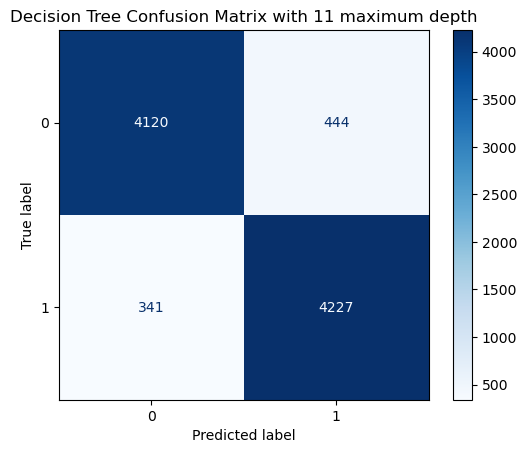

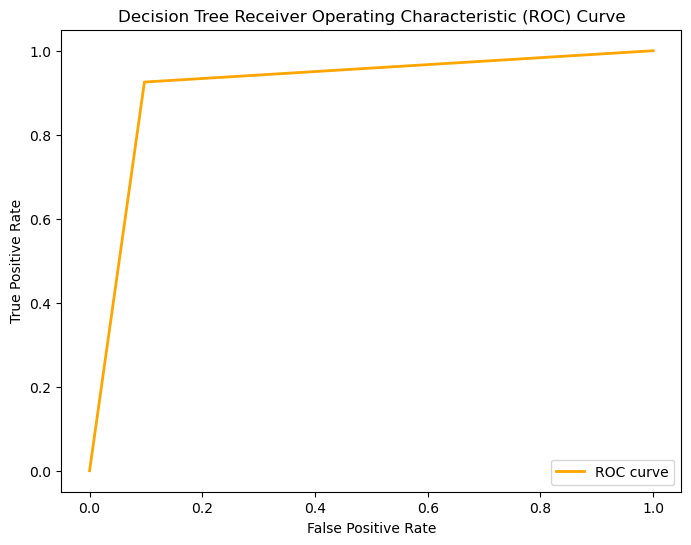


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      4564
           1       0.96      0.98      0.97      4568

    accuracy                           0.97      9132
   macro avg       0.97      0.97      0.97      9132
weighted avg       0.97      0.97      0.97      9132

Test data accuracy:  0.9702146298729741
Train data accuracy:  0.9712314623615543


<Figure size 800x600 with 0 Axes>

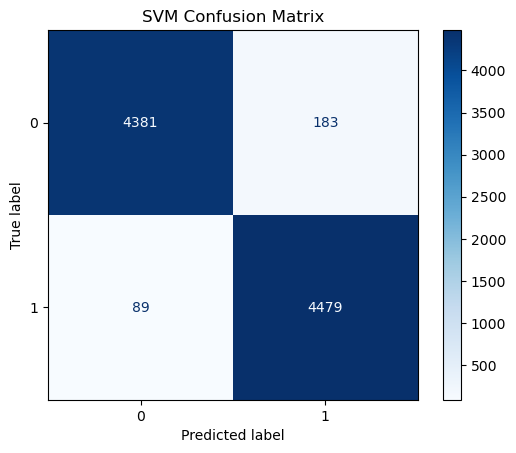

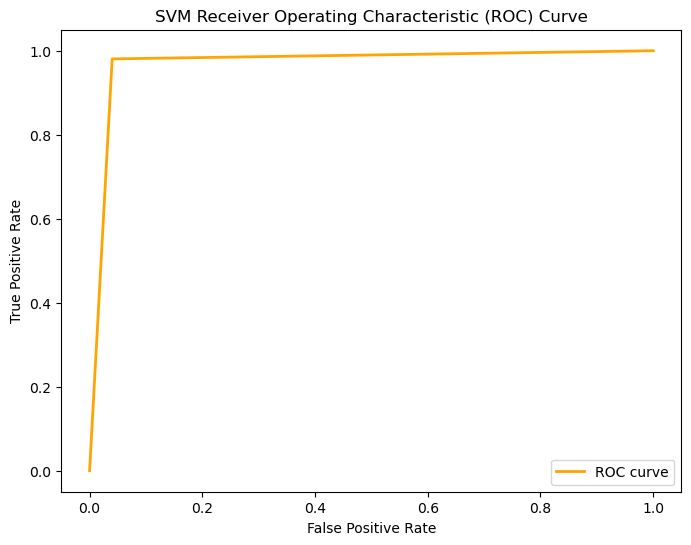


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      4564
           1       0.96      0.98      0.97      4568

    accuracy                           0.97      9132
   macro avg       0.97      0.97      0.97      9132
weighted avg       0.97      0.97      0.97      9132

Test data accuracy:  0.9708716600963644
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

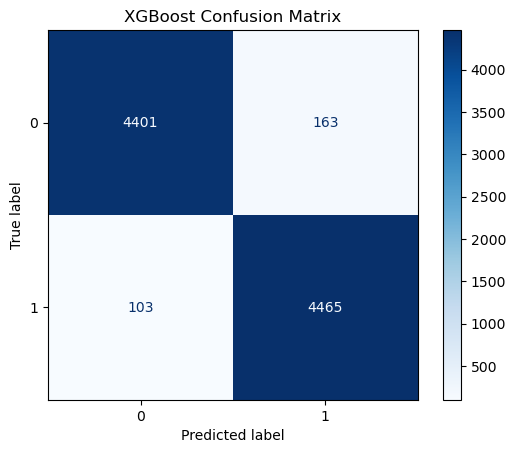

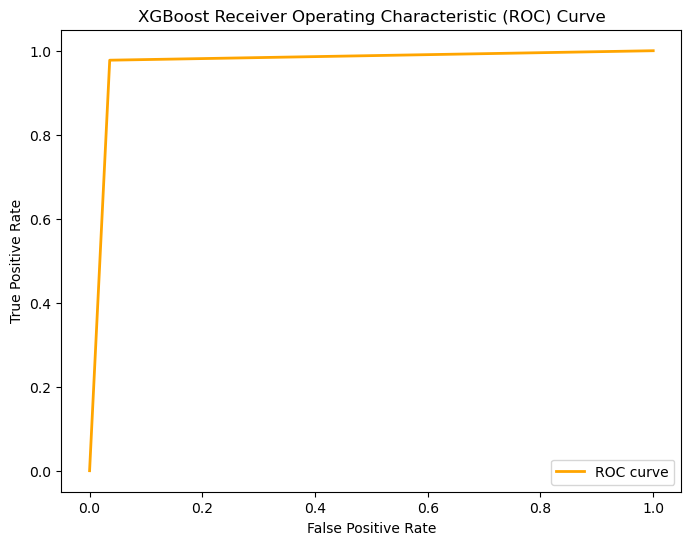

In [16]:
evaluate_clasification_model(clean_upsampled_dummy_approved, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

In [101]:
clean_upsampled_dummy_approved = clean_upsampled_dummy_df.drop(columns="RiskScore")


---------------------------------------------------

Logistic Regression
              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1426
           1       0.88      0.87      0.87      1442

    accuracy                           0.87      2868
   macro avg       0.87      0.87      0.87      2868
weighted avg       0.87      0.87      0.87      2868

Test data accuracy:  0.8720362622036262
Train data accuracy:  0.8716377764494919


<Figure size 800x600 with 0 Axes>

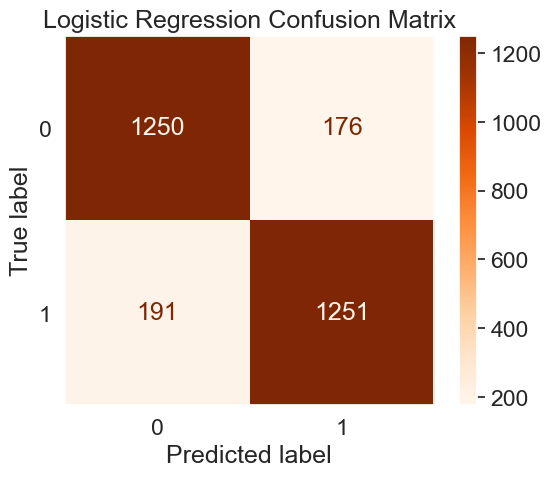

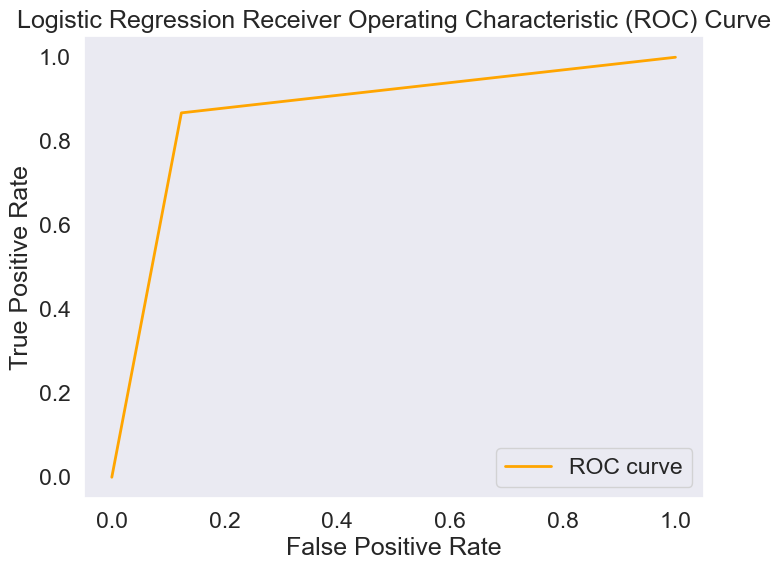


---------------------------------------------------

KNN
with 7 neighbors
              precision    recall  f1-score   support

           0       0.77      0.79      0.78      1426
           1       0.79      0.77      0.78      1442

    accuracy                           0.78      2868
   macro avg       0.78      0.78      0.78      2868
weighted avg       0.78      0.78      0.78      2868

Test data accuracy:  0.7789400278940027
Train data accuracy:  0.8401075911536162


<Figure size 800x600 with 0 Axes>

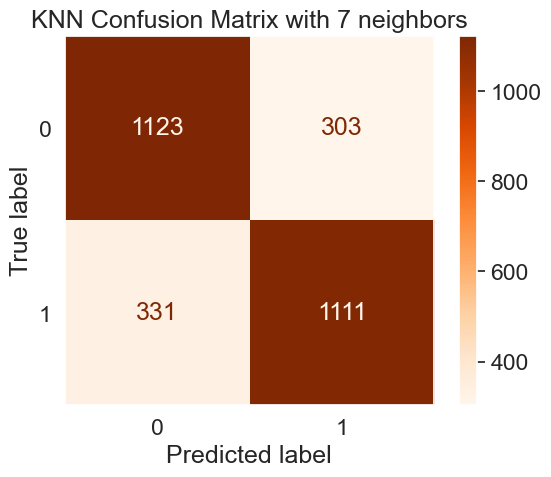

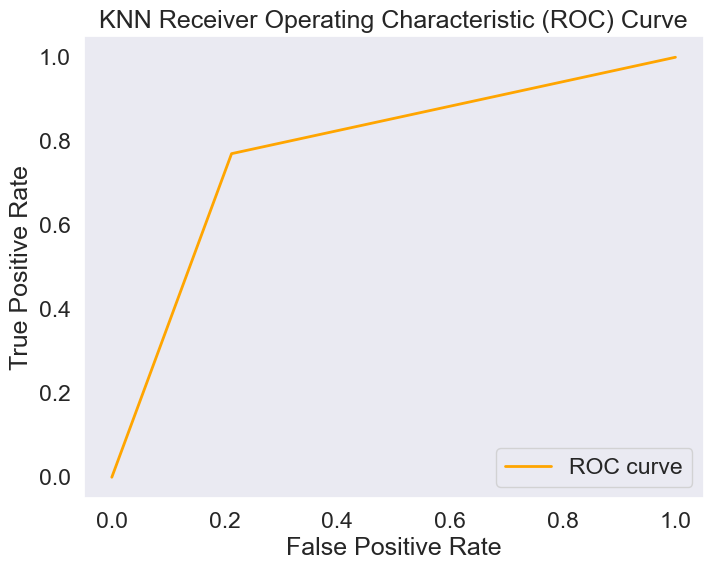


---------------------------------------------------

Decision Tree
with 6 maximum depth
              precision    recall  f1-score   support

           0       0.91      0.86      0.88      1426
           1       0.87      0.91      0.89      1442

    accuracy                           0.89      2868
   macro avg       0.89      0.89      0.89      2868
weighted avg       0.89      0.89      0.89      2868

Test data accuracy:  0.8870292887029289
Train data accuracy:  0.9094441123729826


<Figure size 800x600 with 0 Axes>

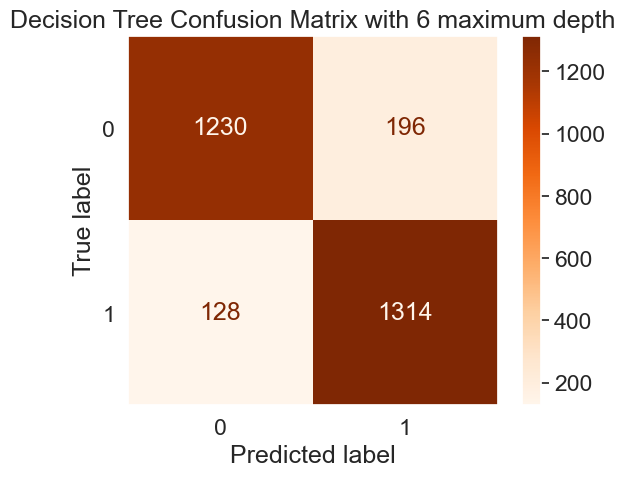

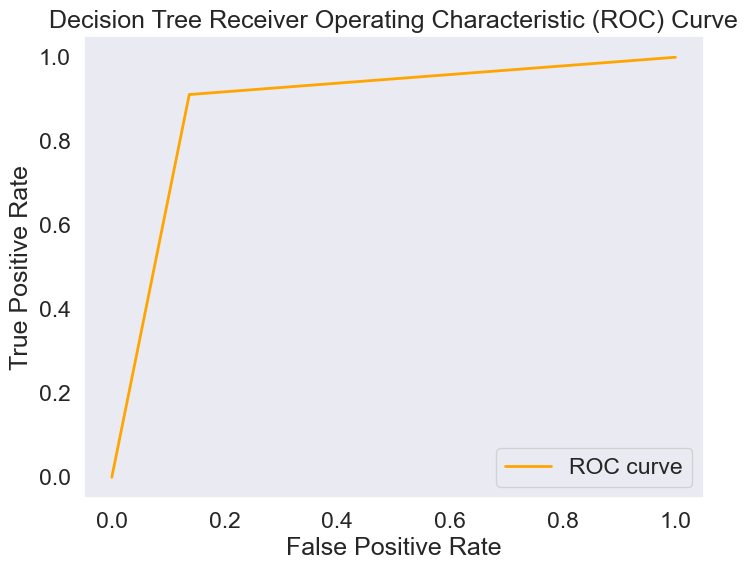


---------------------------------------------------

SVM
              precision    recall  f1-score   support

           0       0.79      0.85      0.82      1426
           1       0.84      0.77      0.80      1442

    accuracy                           0.81      2868
   macro avg       0.81      0.81      0.81      2868
weighted avg       0.81      0.81      0.81      2868

Test data accuracy:  0.8092747559274756
Train data accuracy:  0.8181410639569635


<Figure size 800x600 with 0 Axes>

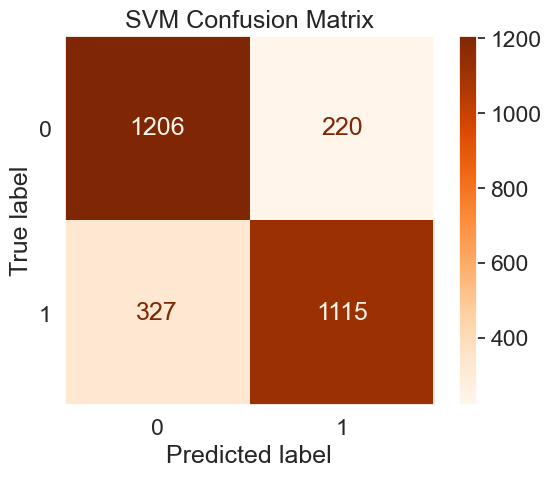

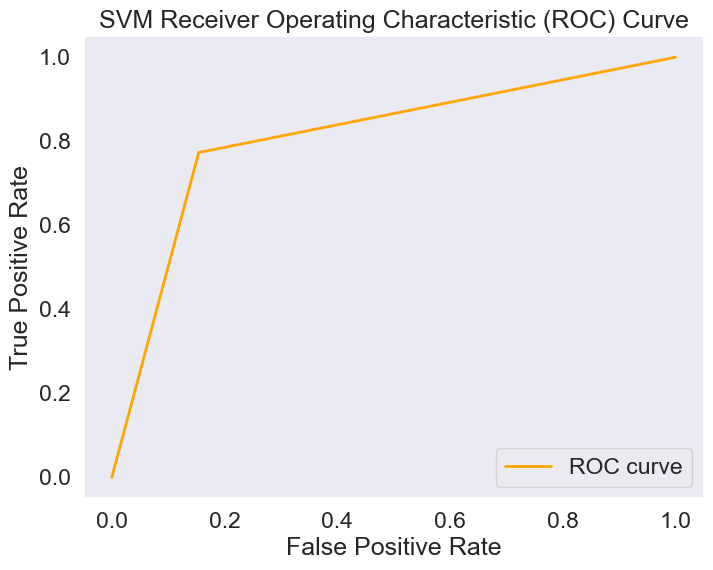


---------------------------------------------------

XGBoost
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1426
           1       0.93      0.97      0.95      1442

    accuracy                           0.95      2868
   macro avg       0.95      0.95      0.95      2868
weighted avg       0.95      0.95      0.95      2868

Test data accuracy:  0.9456066945606695
Train data accuracy:  1.0


<Figure size 800x600 with 0 Axes>

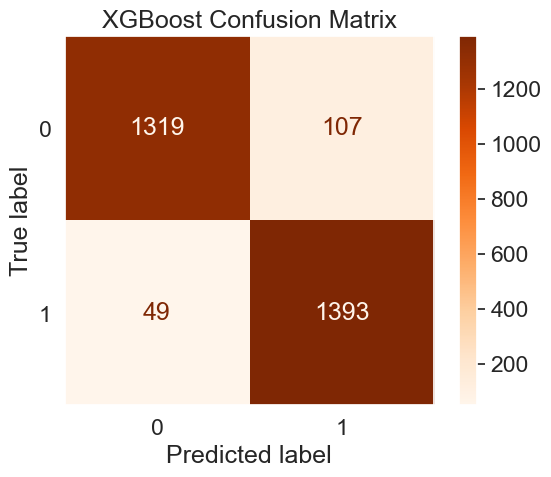

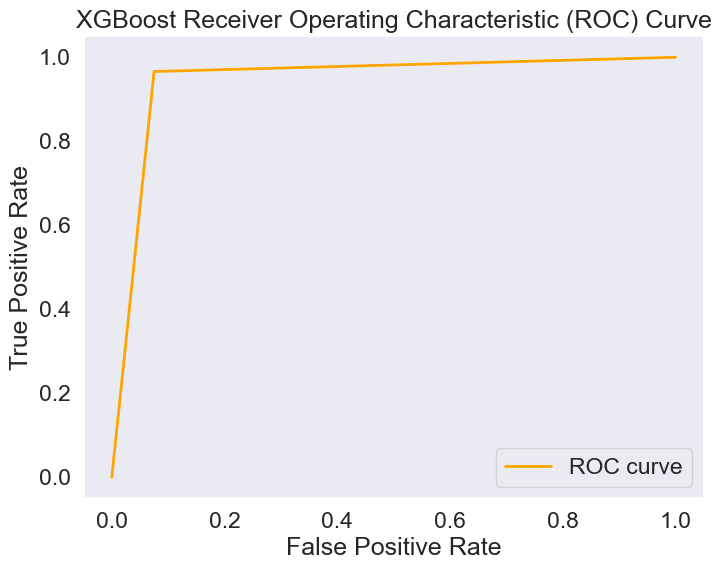

In [ ]:
evaluate_clasification_model(clean_upsampled_dummy_approved, "LoanApproved", trees=range(5,16), neighbors=range(5,16))

# ML Model to predict Risk Score (Upsampled Clean Data without Loan Approval)

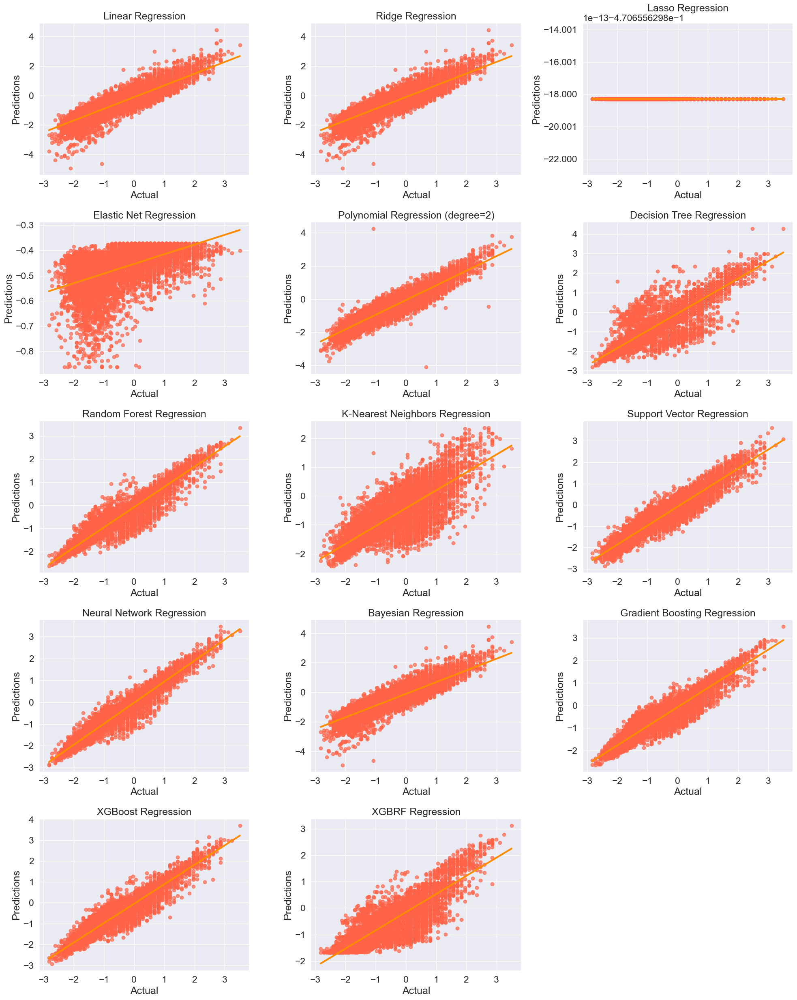

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7845,0.4957,0.2458,0.4117
Ridge Regression,0.7845,0.4957,0.2457,0.4117
Lasso Regression,-0.0000,1.0679,1.1405,0.9222
Elastic Net Regression,0.0714,1.0291,1.0591,0.8808
Polynomial Regression (degree=2),0.8753,0.3771,0.1422,0.2946
Decision Tree Regression,0.7915,0.4877,0.2378,0.2631
Random Forest Regression,0.9167,0.3083,0.0950,0.1917
K-Nearest Neighbors Regression,0.6008,0.6747,0.4552,0.4698
Support Vector Regression,0.9089,0.3224,0.1039,0.2429


In [107]:
clean_upsampled_dummy_risk = clean_upsampled_dummy_df.drop(columns="LoanApproved")
evaluate_regresion_model(clean_upsampled_dummy_risk, "RiskScore", graphs=True).T

### We try to Log Transform to check for improvement

In [108]:
abs_clean_upsampled_dummy_risk = clean_upsampled_dummy_risk.copy()

for column in abs_clean_upsampled_dummy_risk.columns:
    abs_clean_upsampled_dummy_risk[column] = abs(abs_clean_upsampled_dummy_risk[column])

abs_clean_upsampled_dummy_risk

,CreditScore,Experience,LoanAmount,LoanDuration,NumberOfDependents,MonthlyDebtPayments,CreditCardUtilizationRate,NumberOfOpenCreditLines,NumberOfCreditInquiries,DebtToIncomeRatio,BankruptcyHistory,PreviousLoanDefaults,PaymentHistory,LengthOfCreditHistory,SavingsAccountBalance,CheckingAccountBalance,TotalLiabilities,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,EmploymentStatus_Employed,EmploymentStatus_Self-Employed,EmploymentStatus_Unemployed,EducationLevel_Associate,EducationLevel_Bachelor,EducationLevel_Doctorate,EducationLevel_High School,EducationLevel_Master,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widowed,HomeOwnershipStatus_Mortgage,HomeOwnershipStatus_Other,HomeOwnershipStatus_Own,HomeOwnershipStatus_Rent,LoanPurpose_Auto,LoanPurpose_Debt Consolidation,LoanPurpose_Education,LoanPurpose_Home,LoanPurpose_Other
0,0.890021,0.395637,0.873672,0.245578,0.348195,1.128029,0.425792,1.165445,1.020325,0.453170,0.235154,0.333426,1.012343,0.711630,0.406671,0.258562,0.361255,0.474026,0.621121,2.681281,0.463323,1.111623,0.272968,0.729062,0.652388,0.227149,0.417114,0.292171,0.273402,0.502655,0.658865,0.223806,0.647491,2.357409,0.410318,0.995908,0.660738,0.229295,0.811318,0.336657,2.019584,0.661441,0.502655,0.579429,0.420743,1.541275,0.333889
1,1.105724,0.222926,0.086551,0.245578,0.373154,0.173418,1.242602,1.138546,2.033558,0.278010,0.235154,0.333426,0.605351,0.711630,0.048307,0.747084,0.564174,0.480067,1.120606,0.895340,0.243267,0.903420,0.901165,0.174264,0.036378,0.158551,0.417114,0.292171,0.273402,1.989437,0.658865,0.223806,0.647491,0.424195,0.410318,1.004108,1.513458,0.229295,1.232562,0.336657,0.495151,0.661441,0.502655,1.725838,0.420743,0.648814,0.333889
2,0.031618,0.749102,0.540390,0.732113,0.348195,1.861556,0.932273,0.589447,1.006140,0.255954,0.235154,0.333426,0.807563,0.841287,0.614720,0.395291,1.960232,0.454410,0.599385,0.445893,0.568953,0.605407,0.629370,0.363493,0.176962,0.158551,0.417114,0.292171,0.273402,0.502655,1.517762,0.223806,0.647491,0.424195,0.410318,0.995908,0.660738,0.229295,0.811318,0.336657,0.495151,1.511850,0.502655,0.579429,2.376749,0.648814,0.333889
3,0.521852,1.456031,0.969319,1.700559,0.373154,1.250334,0.117617,0.589447,0.007093,0.939471,0.235154,0.333426,0.607919,0.592175,0.495260,0.251881,0.653591,0.262471,0.797576,0.001185,0.230312,1.725605,1.464331,0.201463,0.262848,0.415684,0.417114,0.292171,0.273402,0.502655,0.658865,0.223806,1.544422,0.424195,0.410318,1.004108,1.513458,0.229295,1.232562,0.336657,0.495151,0.661441,0.502655,0.579429,0.420743,1.541275,0.333889
4,0.439006,0.046193,1.169194,0.732113,0.373154,0.749653,0.213746,1.741443,1.006140,1.291147,0.235154,0.333426,0.405707,1.438563,0.513428,1.424492,0.401403,1.126469,1.172293,0.001185,1.312148,1.181127,1.495584,0.861928,0.979511,1.898515,0.417114,0.292171,0.273402,1.989437,0.658865,0.223806,0.647491,0.424195,0.410318,0.995908,0.660738,0.229295,1.232562,0.336657,0.495151,0.661441,0.502655,1.725838,0.420743,0.648814,0.333889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30435,0.468970,0.543108,1.037954,0.427914,1.094504,0.914218,0.460326,0.202414,0.007093,0.767685,0.235154,0.333426,0.759483,0.766599,0.265781,0.446499,0.496149,0.578282,0.793369,1.200284,0.142610,0.303421,0.662009,0.805507,0.885190,1.230065,0.417114,0.292171,0.273402,0.502655,0.658865,0.223806,1.544422,0.424195,0.410318,1.004108,1.513458,0.229295,0.811318,0.336657,0.495151,1.511850,0.502655,0.579429,0.420743,1.541275,0.333889
30436,0.908694,0.923588,0.113275,0.561190,0.496435,0.940497,0.780895,0.968565,0.832975,0.951989,0.235154,2.999167,0.605351,1.367115,0.069226,0.101898,0.386924,0.662575,0.344306,0.969377,6.021030,1.020184,0.469910,0.237457,0.125783,1.263817,0.417114,0.292171,0.273402,0.502655,1.145769,0.223

----------------------Data Normalized with Log Transform-------------------------


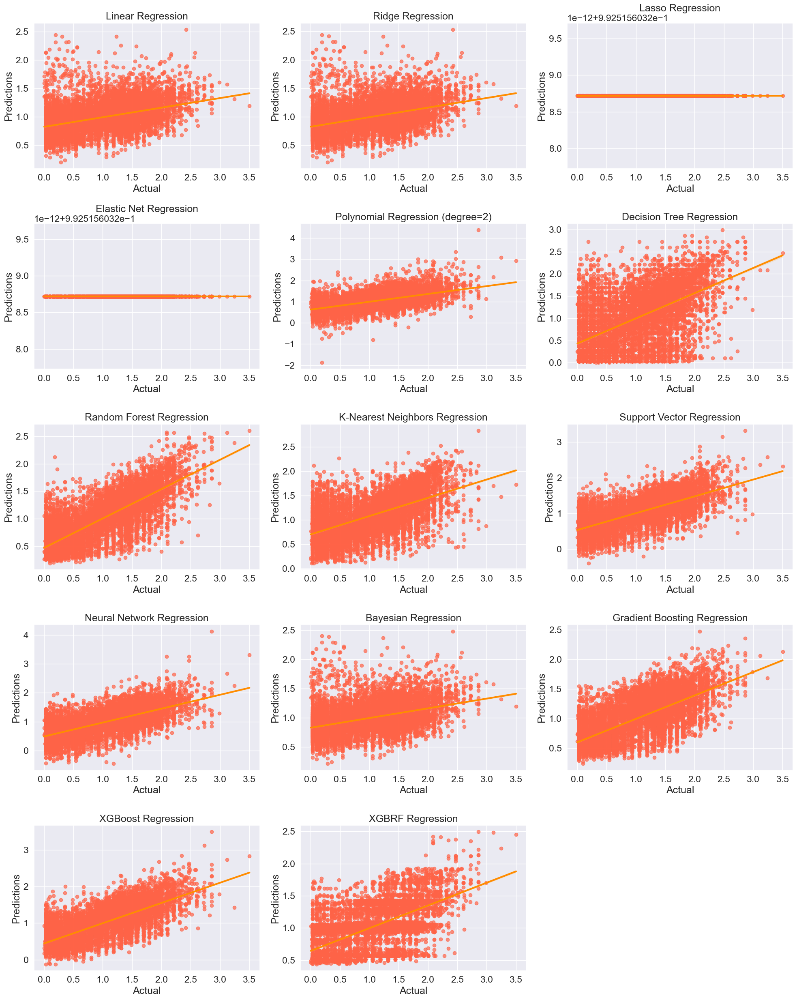

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.1646,0.5730,0.3283,0.4736
Ridge Regression,0.1646,0.5730,0.3283,0.4737
Lasso Regression,-0.0001,0.6269,0.3930,0.5359
Elastic Net Regression,-0.0001,0.6269,0.3930,0.5359
Polynomial Regression (degree=2),0.3400,0.5093,0.2594,0.4138
Decision Tree Regression,0.1632,0.5734,0.3288,0.4123
Random Forest Regression,0.5875,0.4026,0.1621,0.3109
K-Nearest Neighbors Regression,0.3124,0.5198,0.2702,0.3925
Support Vector Regression,0.4678,0.4573,0.2091,0.3535


In [109]:
evaluate_regresion_model(abs_clean_upsampled_dummy_risk, "RiskScore", graphs=True,log=True).T

### We try to normalize the data with Standard Scaler to check for improvement

----------------------Data Normalized with Standard Scaler-------------------------


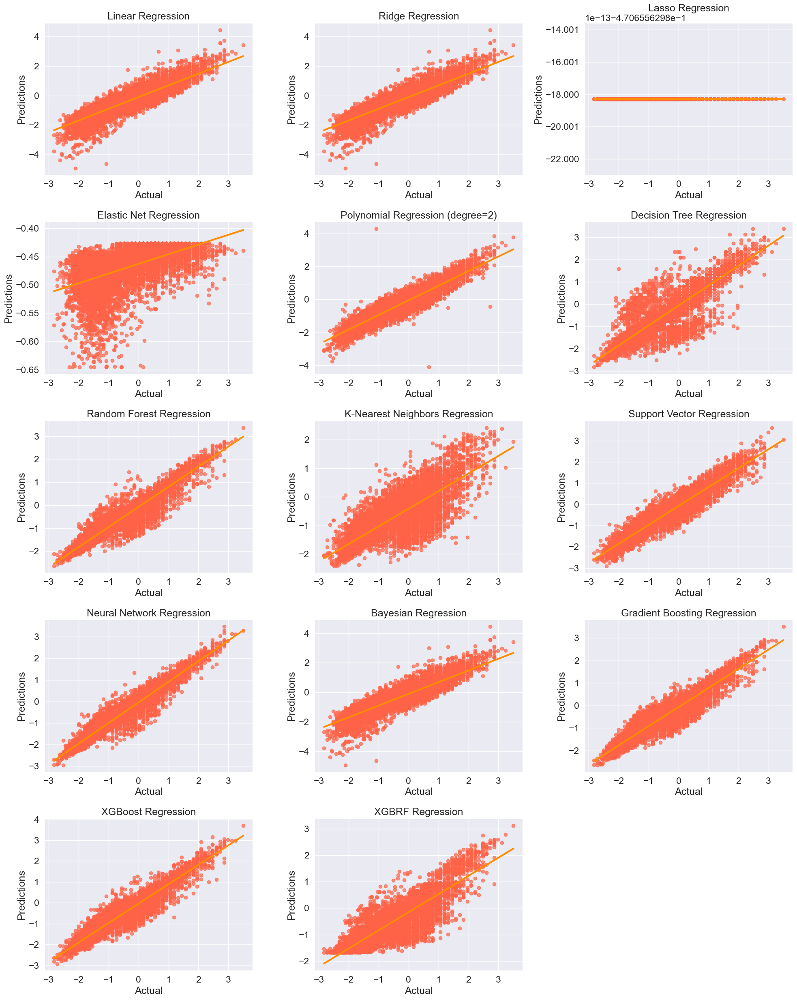

,R²,RMSE,MSE,MAE
Model,,,,
Linear Regression,0.7845,0.4957,0.2457,0.4116
Ridge Regression,0.7845,0.4957,0.2457,0.4117
Lasso Regression,-0.0000,1.0679,1.1405,0.9222
Elastic Net Regression,0.0331,1.0501,1.1027,0.9035
Polynomial Regression (degree=2),0.8753,0.3771,0.1422,0.2946
Decision Tree Regression,0.7979,0.4801,0.2305,0.2588
Random Forest Regression,0.9160,0.3095,0.0958,0.1924
K-Nearest Neighbors Regression,0.5915,0.6825,0.4659,0.4780
Support Vector Regression,0.9074,0.3250,0.1056,0.2447


In [110]:
evaluate_regresion_model(clean_upsampled_dummy_risk, "RiskScore", graphs=True,stand=True).T

In [29]:
def evaluate_regresion_model2(df, target, size=0.3, random=42, shuff=True, round_digits=4, graphs=False, stand=False, log=False):
    """
    Function to automatically evaluate ML regresion models and returns a df with the comparison
    """
    from sklearn.model_selection import train_test_split
    from sklearn.neural_network import MLPRegressor
    from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, root_mean_squared_error
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import math

    # Definition of the models
    models = {
        'Neural Network Regression': MLPRegressor(max_iter=1500),  # Multi-layer perceptron (neural network)
        }

    metrics = {        
        'Model': [],
        'R²': [],
        'RMSE': [],
        'MSE': [],
        'MAE': []
        }
    
    # Separate features and target
    X = df.drop(columns=[target])
    y = df[target]

    # Separate data into train and test:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = size, random_state = random, shuffle = shuff)

    #Run all the models and store the results
    predictions_dict = {}
    for key, model in models.items():
        #print(key)
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        metrics['Model'].append(key)
        metrics['R²'].append(r2_score(y_test, predictions))
        metrics['RMSE'].append(root_mean_squared_error(y_test, predictions))
        metrics['MSE'].append(mean_squared_error(y_test, predictions))
        metrics['MAE'].append(mean_absolute_error(y_test, predictions))
        predictions_dict[key] = predictions

    # Convert metrics to DataFrame
    df_metrics = round(pd.DataFrame(metrics), round_digits).set_index("Model").T

    # Plot subplots for Actual vs. Predicted if graphs=True
    if graphs:
        n_models = len(models)
        nrows = math.ceil(n_models / 3)  # Adjust row count to have 3 plots per row
        fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(20, 5 * nrows))
        axes = axes.flatten()

        for i, (key, predictions) in enumerate(predictions_dict.items()):
            comparison_df = pd.DataFrame({'predictions': predictions, 'actual': y_test}).reset_index(drop=True)
            sns.regplot(x='predictions', y='actual', data=comparison_df, scatter_kws={"color": "#2A5783", "alpha": 0.7},
                        line_kws={"color": "#79AACF", "linewidth": 3}, ax=axes[i])
            axes[i].set_xlabel('Risk Score IronBot')
            axes[i].set_ylabel('Risk Score Riesgos')
            axes[i].spines['top'].set_visible(False)
            axes[i].spines['right'].set_visible(False)
            axes[i].spines['left'].set_visible(True)
            axes[i].spines['bottom'].set_visible(True)

        # Hide any empty subplots if n_models is not a multiple of 3
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()
    
    return df_metrics

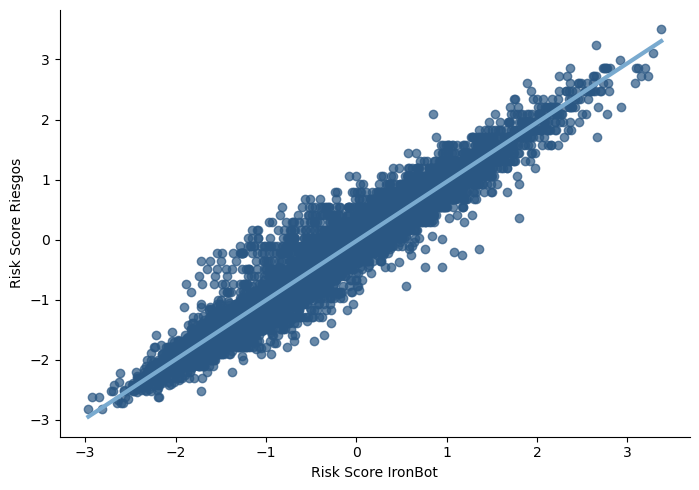

,R²,RMSE,MSE,MAE
Model,,,,
Neural Network Regression,0.9419,0.2577,0.0664,0.1831


In [30]:
clean_upsampled_dummy_risk = clean_upsampled_dummy_df.drop(columns="LoanApproved")
evaluate_regresion_model2(clean_upsampled_dummy_risk, "RiskScore", graphs=True).T